<a href="https://colab.research.google.com/github/kteppris/RealWaste/blob/main/2_EDA_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**22.02.2024 (Flemming)**: \
Hier möchte ich die EDA mal ein wenig "ins Reine schreiben". \
Die Kommentare im Code ändere ich später nochmal, ich will erstmal die Inhalte haben und dass es funktioniert.

# Explorative Datenanalyse (EDA)

Der Begriff der Explorativen Datenanalyse (EDA) geht auf Tukey [(1962)](https://www.jstor.org/stable/i312810) zurück, der den Begriff der Datenanalyse wie folgt definierte:
\
\
_"Procedures for analyzing data, techniques for interpreting the results of such procedures, ways of planning the gathering of data to make its analysis easier, more precise or more accurate, and all the machinery and results of (mathematical) statistics which apply to analyzing data."_
\
\
Die EDA ziehlt demnach darauf ab, mit statistischen Methoden die wesentlichen Strukturen eines Datensatzes zu entdecken, Muster und Anomalien zu identifizieren und die weiteren Analysen durch die gewonnenen Einblicke zu leiten.

Das [DASC-PM v1.1](https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf) verortet die EDA in der Projektphase der _Datenbereitstellung_.
Als Ergebnis dieser Projektphase ensteht aus einer oder mehreren _Ursprungsdatenquellen_ eine _Analytische Datenquelle_, die im weiteren Projektverlauf zu Analysezwecken genutzt wird.

Um diese Analytische Datenquelle zu erzeugen, ist die Bearbeitung der Kernaufgaben _Datenaufbereitung_, _Datenmanagement_ und _Explorative Datenanalyse_ erforderlich.

Das DASC-PM v1.1 schreibt für die EDA keine feste Abfolge für anzuwenende Verfahren vor, da auch ihre Auswahl vom Untersuchungsgegenstand abhängig ist.

Beim Untersuchungsgegenstand dieser Ausarbeitung, dem [RealWaste-Datensatz](https://ieee-dataport.org/documents/realwaste#:~:text=RealWaste%20is%20an%20image%20dataset,facility%20in%20Wollongong%20NSW%20Australia.) handelt es sich wie in **Verweis** beschrieben um Bilddateien und somit um unstrukturierte, hochdimensionale Daten, die aus einer Vielzahl von Pixelwerten bestehen.

Die nachfolgende EDA zielt darauf ab, für den untersuchten Datensatz die Verteilung über die Klassen zu ermitteln und eine zufällige Auswahl von Bildern aus dem Datensatz einer ersten visuellen Inspektion zu unterziehen. \
Aus dieser Erstinspektion werden weitere Schritte im Rahmen der EDA zu weiterführenden Untersuchungen durch _Farbhistogramme_, _Local Binary Patterns (LBP)_ oder _Canny Edge Detection Filter_ abgeleitet. Diese weiterführenen Untersuchungen zielen darauf ab, Features aus den Bildern des RealWaste-Datensatzes zu extrahieren. \

Ziel der EDA ist es, die gewonnen Features mit klassischen ML-Methoden wie K-Nearest-Neigbors (KNN), Support Vector Machines (SVM) oder Random Forest für eine Klassifikation der Bilder einzusetzen.

Die zentralen Erkenntnisse der EDA werden in Form von Artefakten (Visualisierungen oder Modelle) festgehalten und Probleme bei der Datenqualität sowie Änderungen des Datenmaterials dokumentiert.

Die Ergebnisse aus dem Training klassischer ML-Modelle bieten wertvolle Benchmarks, gegen die später implementierte Deep-Learning-Modelle verglichen werden können. Darüber hinaus erlaubt dieser Ansatz eine effiziente Ressourcennutzung, indem er frühzeitig Aufschluss darüber gibt, ob und in welchem Maße tiefergehende, ressourcenintensive Deep-Learning-Verfahren potenziell zu einer signifikanten Verbesserung der Modellleistung führen könnten. Somit stellt die durchgeführte EDA in Verbindung mit der Anwendung klassischer ML-Methoden auf zuvor extrahierte Features eine fundierte Basis dar, auf der weiterführende, komplexere Analyseverfahren aufbauen können.

***
**Quellen:**
* DASC-PM v1.1 \
https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf
* Tukey, J. W. (1962). The Future of Data Analysis. The Annals of Mathematical Statistics, 33(1), 1–67. \
http://www.jstor.org/stable/2237638
* RealWaste-Datensatz \
https://ieee-dataport.org/documents/realwaste#:~:text=RealWaste%20is%20an%20image%20dataset,facility%20in%20Wollongong%20NSW%20Australia.

***

## Daten laden und vorverarbeiten

Das Dictionary '**images_resized**' wird im Ergebnis der Vorverarbeitung erzeugt.

Alternativ hier für die Vorverarbeitung später den Code von Keno verwenden.

Über die Funktion _load_and_resize_images_ werden die Bilder des RealWaste-Datensatzes neu skaliert, um

In [32]:
import sys
import os
from pathlib import Path

# Funktion, die prüft, ob dieses Skript in Colab ausgeführt wird
def in_colab():
    # sys beinhaltet alle bereits geladenen Pakete
    return 'google.colab' in sys.modules  # google.colab wird automatisch in Colab vorgeladen, daher Indiz für Colab Environment

code_repo_path = Path("/content/drive/MyDrive/MADS/RealWaste") if in_colab() else Path.cwd()

if in_colab():
    # Google Drive einbinden zum persistieren von Code, Daten und Ergebnissen
    from google.colab import drive
    drive.mount('/content/drive')
    if not code_repo_path.exists():
        raise FileNotFoundError("Code und Datenordner konnte nicht gefunden werden. Bitte zuerst das Notebook '1_Hauptnotebook.ipynb' ausführen.")
    else:
        # wechsle Arbeitsverzeichnis zu code_repo_path
        %cd {code_repo_path}
        print(f"Wechsel Arbeitsverzeichnis zu {Path.cwd()}")
        %pip install -r requirements.txt
else:
    print("Stellen Sie sicher, dass das richtige Venv als Kernel ausgewählt ist,\nwelches wie in '1_Hauptnotebook.ipynb' beschrieben erstellt wurde.")

data_path = code_repo_path / "data"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/MADS/RealWaste
Wechsel Arbeitsverzeichnis zu /content/drive/MyDrive/MADS/RealWaste


In [33]:
# Überprüfe den aktuellen Arbeitsordner
print("Current Directory:", os.getcwd())

# Listet den Inhalte des Datenverzeichnisses auf und gibt die Namen der Klassen-Unterordner aus
print("Directory Contents:", os.listdir('./data'))

Current Directory: /content/drive/MyDrive/MADS/RealWaste
Directory Contents: ['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Miscellaneous Trash', 'Paper', 'Plastic', 'Textile Trash', 'Vegetation']


In [34]:
import os
from PIL import Image
import numpy as np

def load_and_resize_images(data_path, new_size): # Bilder neu skaliert mit dem Argument 'new_size(,)'
    images_resized = {}
    class_names = [d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d)) and not d.startswith('.')]  # Versteckte Ordner überspringen

    for class_name in class_names:
        class_folder = os.path.join(data_path, class_name)
        image_files = [f for f in os.listdir(class_folder) if f.endswith('.jpg') and not f.startswith('.')]  # Nur .jpg Bilder verarbeiten
        images_resized[class_name] = []

        for image_file in image_files:
            img_path = os.path.join(class_folder, image_file)
            img = Image.open(img_path)
            img_resized = img.resize(new_size)
            images_resized[class_name].append(np.array(img_resized))

    return images_resized

# Neue Größe auf die Bilder aus meinem Ordner anwenden
images_resized = load_and_resize_images(data_path=data_path, new_size = (128, 128))

## Datensatz erkunden

Der vorliegende RealWaste-Datensatz wurde mit dem Code aus dem vorangegangenen Abschnitt erfolgreich geladen und vorverarbeitet.
Im Rahmen dieser Vorverarbeitung wurde die Auflösung der Bilder zwecks schnellerer Verarbeitung herunterskaliert auf 128x128 Pixel, was eine Gesamtzahl von 16.384 Pixeln pro Bild entspricht. In Summe enthält der RealWaste-Datensatz 4.752 Bilder.

In [35]:
def get_images_shape_info(images_resized):
    total_images = sum(len(images) for images in images_resized.values())
    # Die Größe und Anzahl der Farbkanäle des ersten Bildes in der ersten Klasse ermitteln
    # Diese Info reicht hier aus, da alle Bilder zuvor auf die gleiche Größe skaliert wurden
    for images in images_resized.values():
        if images:
            image_shape = images[0].shape  # (Höhe, Breite, Farbkanäle)
            break

    print(f"Gesamtanzahl der Bilder: {total_images}")
    print(f"Größe eines Bildes in Pixeln: {image_shape[:2]}")
    print(f"Anzahl der Farbkanäle: {image_shape[2]}")

get_images_shape_info(images_resized)

Gesamtanzahl der Bilder: 4752
Größe eines Bildes in Pixeln: (128, 128)
Anzahl der Farbkanäle: 3


### Anzahl Bilder und Verteilung auf die Klassen

Der RealWaste-Datensatz enthält insgesamt 4808 Bilder, welche sich auf 9 Klassen verteilen. Die Verteilung auf die Klassen ist im gegebenen Datensatz nicht ausgeglichen, ihre relativen Anteile an der Gesamtmenge an Bildern reichen von ~6,7% (Textile Trash) bis zu ~19,4% (Plastic). Die relativen Anteile aller Klassen am Gesamtdatensatz sind dem nachfolgenden Balkendiagramm zu entnehmen.

In [36]:
# Alle Klassenordner auflisten
classes = os.listdir(data_path)

# Erstelle ein Dictionary
images_per_class = {}

for class_name in classes:
    # Pfad zum Klassenordner
    class_path = os.path.join(data_path, class_name)

    # Alle Dateien in diesem Klassenordner auflisten
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Anzahl der Bilder in diesem Klassenordner zählen
    image_count = len(images)
    images_per_class[class_name] = image_count

# Ergebnisse ausgeben
for class_name, count in images_per_class.items():
    print(f"Class '{class_name}' beinhaltet {count} Bilder")

Class 'Cardboard' beinhaltet 461 Bilder
Class 'Food Organics' beinhaltet 411 Bilder
Class 'Glass' beinhaltet 420 Bilder
Class 'Metal' beinhaltet 790 Bilder
Class 'Miscellaneous Trash' beinhaltet 495 Bilder
Class 'Paper' beinhaltet 500 Bilder
Class 'Plastic' beinhaltet 921 Bilder
Class 'Textile Trash' beinhaltet 318 Bilder
Class 'Vegetation' beinhaltet 436 Bilder


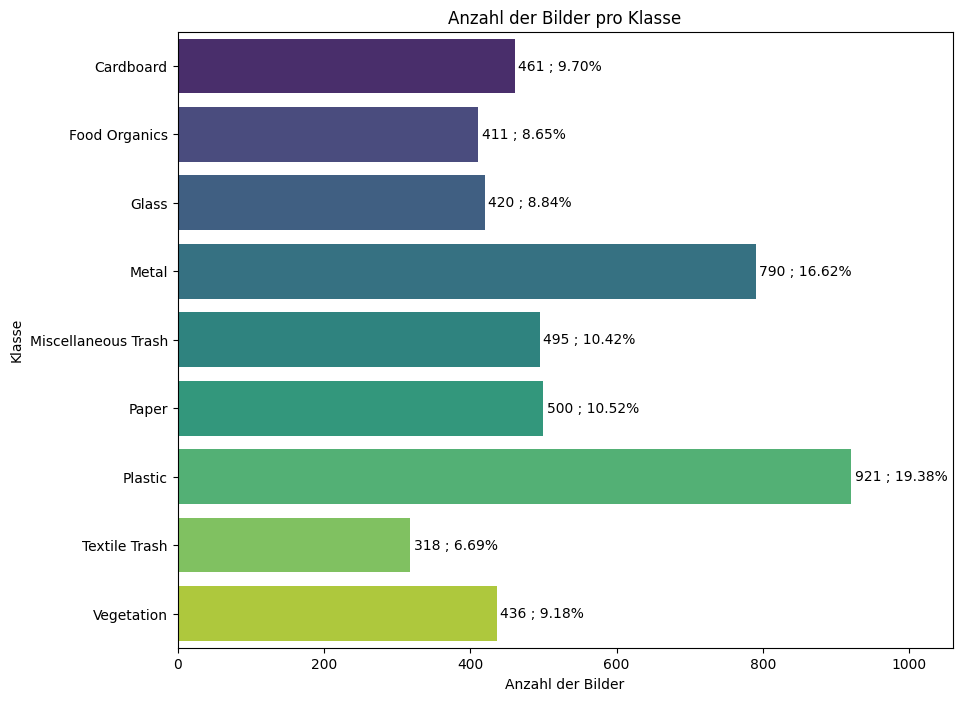

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


# Daten für das Balkendiagramm vorbereiten
class_names = list(images_per_class.keys())
image_counts = list(images_per_class.values())

# Gesamtanzahl der Bilder berechnen
total_images = sum(image_counts)

# Balkendiagramm erstellen
plt.figure(figsize=(10, 8))
sns.barplot(x=image_counts, y=class_names, palette="viridis")
plt.title('Anzahl der Bilder pro Klasse')
plt.xlabel('Anzahl der Bilder')
plt.ylabel('Klasse')

# Rechten Rand für Textbeschriftungen erhöhen
plt.xlim(0, max(image_counts) * 1.15)  # 15% mehr Platz für Beschriftungen

# Beschriftungen mit Prozentangabe hinzufügen
for index, value in enumerate(image_counts):
    percentage = (value / total_images) * 100  # Prozentualen Anteil berechnen
    plt.text(value + max(image_counts) * 0.005, index, f"{value} ; {percentage:.2f}%", va='center')  # Etwas Puffer hinzufügen, damit die Beschriftung ins Diagramm passt

plt.show()

### Beispielbilder für jede Klasse anzeigen

Nach der erfolgten quantitativen Untersuchung im Hinblick auf die Verteilung der Bilder auf die Klassen, wird nachfolgend der Datensatz stichprobenartig einer Sichtprüfung unterzogen. \
Hierfür werden je 3 zufällige Bilder aus jeder der 9 Klassen in Form einer 3x9-Matrix ausgegeben. \
Durch ein erneutes Ausführen des zugehörigen Codes können neue zufällige Bilder für jede Klasse geladen werden. \

Die Inaugenscheinnahme randomisierter Bilder aus dem Datensatz lieferte Grund für folgende Beobachtungen: \
* Die Hintergründe der Bilder sind uneinheitlich gefärbt und texturiert, ließen sich keine Hintergrundfärbungen zu bestimmten Klassen 1:1 zuordnen.
* Einige Farben scheinen deutlich häufiger in bestimmten Klassen aufzutreten als andere Farben. (Z.B. _Blautöne_ bei _Paper_ oder _Plastic_, nicht aber bei _Food Organics_ etc.)
* Bestimmte Formen/Kanten treten in einigen Klassen häufiger auf als in anderen Klassen. (z.B. rechtwinklige Ecken eher in _Metall_ oder _Cardboard_ als in _Food Organics_).
* Bestimmte Texturen (--> hier noch weiter schreiben)

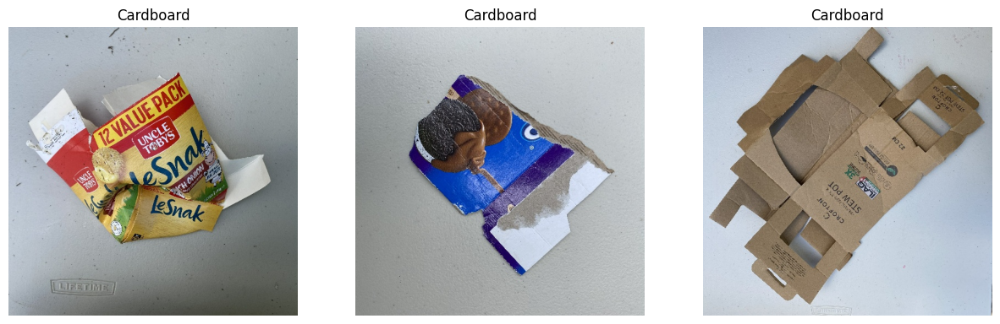

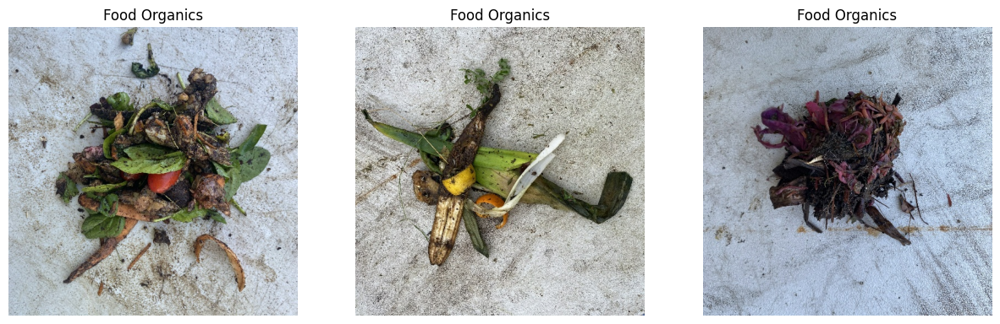

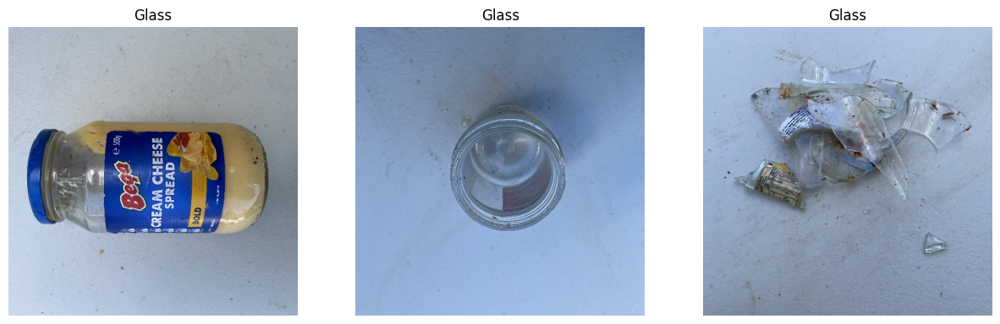

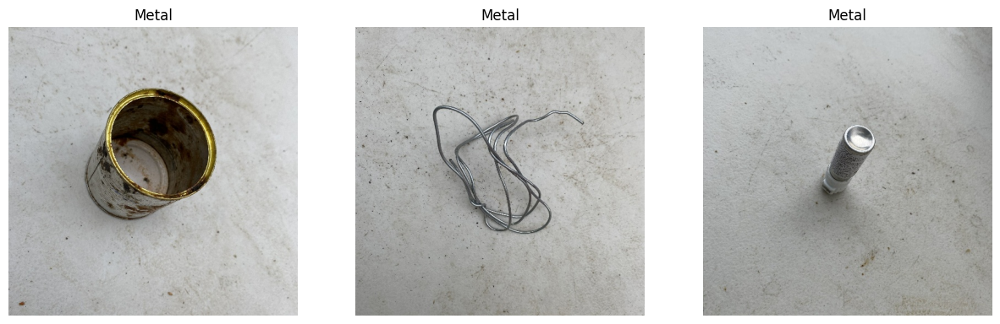

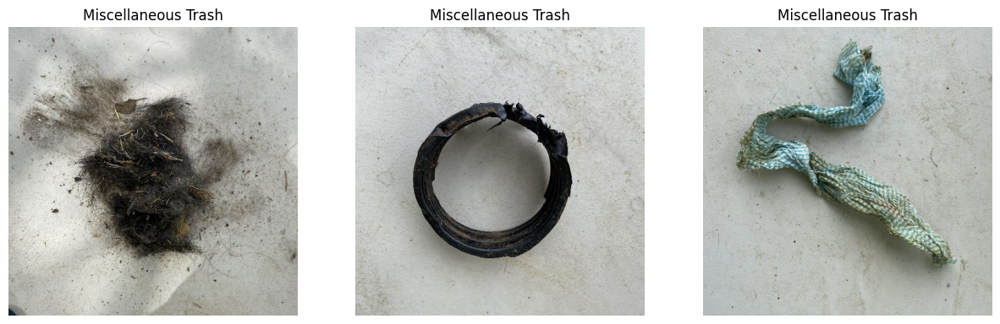

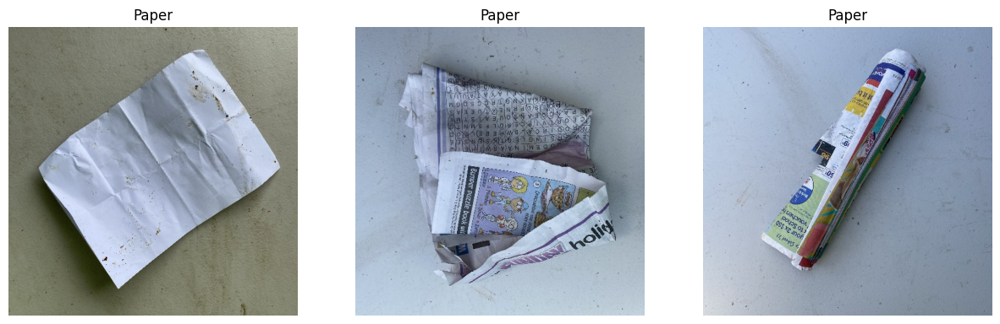

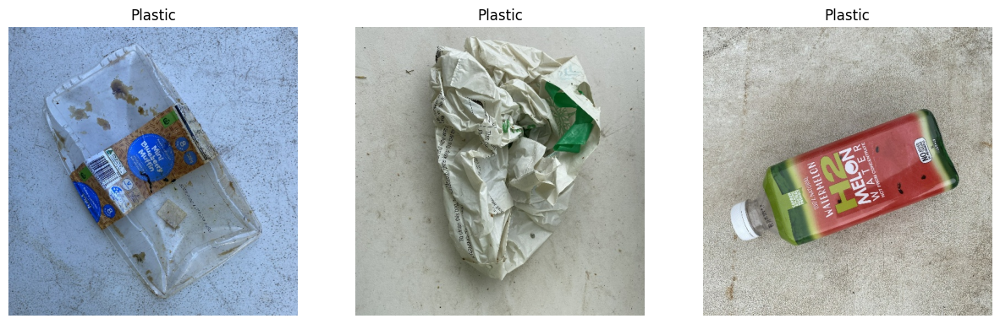

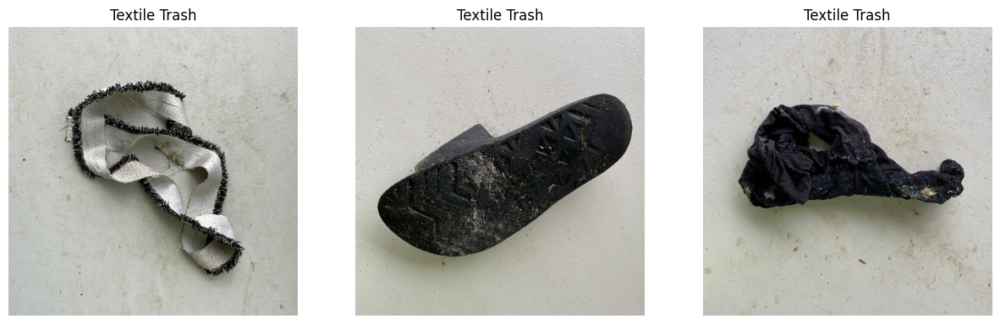

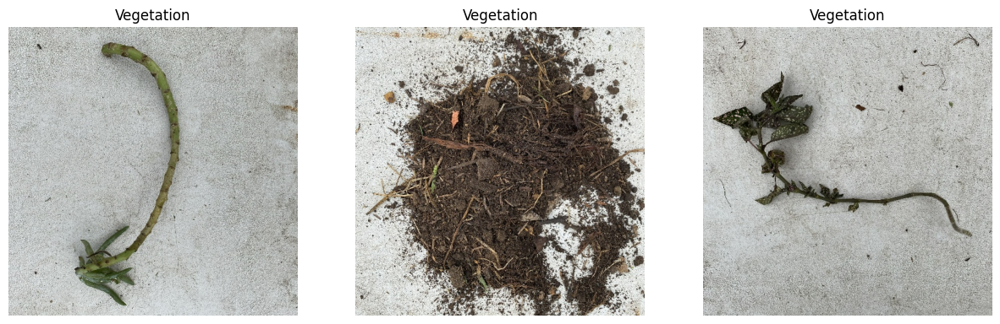

In [38]:
import random
from PIL import Image

# 'class_names' enthält die Namen aller Klassen
for class_name in class_names:
    # Pfad zum Klassenordner
    class_folder = os.path.join(data_path, class_name)

    # Liste aller Bilddateien in diesem Ordner
    image_files = os.listdir(class_folder)

    # Wähle zufällige Bilder
    selected_images = random.sample(image_files, 3)

    # Zeige diese Bilder an
    plt.figure(figsize=(15, 5))
    for i, image_file in enumerate(selected_images):
        img_path = os.path.join(class_folder, image_file)
        img = Image.open(img_path)
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    plt.show()


## Feature Engineering

Aus den Beobachtungen wurden die nachfolgenden Hypothesen abgeleitet, die nachfolgend durch die Anwendung klassischer ML-Verfahren untersucht werden sollen:
* **Hypothese 1**: Die **Farben** sind kein relevantes Feature für eine korrekte Klassifikation der Bilder des RealWaste-Datensatzes
* **Hypothese 2**: Die **Texturen** sind kein relevantes Feature für eine korrekte Klassifikation der Bilder des RealWaste-Datensatzes.
* **Hypothese 3**: Die **Kanten** sind kein relevantes Feature für eine korrekte Klassifikation des RealWaste-Datensatzes.

Zur Überprüfung dieser Hypothesen und somit zur Identifikation relevanter Features im vorliegenden unstrukturierten Datensatz wird nachfolgend ein _Feature Engineering_ durchgeführt.

Feature Engineering stellt eine zentrale Aufgabe im Zuge der Datenaufbereitung für maschinelles Lernen dar (vgl. Nargesian et al. [(2017)](https://doi.org/10.24963/ijcai.2017/352.), S. 2529). Hierbei werden aus gegebenen Merkmalen eines Datensatzes neue Merkmale konstruiert, die zu einer Steigerung der Vorhersageleistung von Modellen beitragen (vgl. ebd.). Hierfür werden Transformationsfunktionen wie arithmetische oder aggregierte Operatoren auf bestehende Merkmale zur Erzeugung der neuen Merkmale angewendet (vgl. ebd.).

Im Rahmen dieser Ausarbeitung werden für die Überprüfung der o.g. Hypothesen jeweils ein neues Merkmal konstruiert. \
Die Konstruktion der Merkmale soll im Fall von _Farbfeatures_ mithilfe von Farbhistogrammen, beim _Kantenfeature_ mithilfe eines _Sobel-Filters_ und für das _Textur-Feature_ über _Local-Binary-Patterns (LBP)_ erfolgen. \

Eine integrierte Betrachtung von Farbhistogrammen in Verbindung mit weiteren Features zu Textur- und Formmerkmalen können erheblich zur klassifikationsleistung von Modellen bei Bilddaten beitragen (vgl. Liu und Yang [(2013)](https://www.sciencedirect.com/science/article/abs/pii/S0031320312002713), S. 197). In diesem Zuge sprechen die Autoren von _content-based image retrival_ (CIBR) (vgl. ebd., S. 188).

Diese Methoden werden vor ihrer Implementierung in den vorliegenden Code jeweils kurz vorgestellt und ihre Auswahl begründet. \



***
**Quellen:**
* Nargesian, F., Samulowitz, H., Khurana, U., Khalil, E., & Turaga, D. (2017). Learning Feature Engineering for Classification. , 2529-2535. https://doi.org/10.24963/ijcai.2017/352.
* Liu, G., & Yang, J.-y. (2013). Content-based image retrieval using color difference histogram. Pattern Recognition, 46(1), 188-198 https://www.sciencedirect.com/science/article/abs/pii/S0031320312002713


***

### Labels extrahieren

In [39]:
def extract_labels_as_array(images):
    # Initialize an empty list for labels
    labels_list = []

    # Loop through each class of images
    for class_name, imgs in images.items():
        # Add the class_name to the labels_list once for each image in this class
        labels_list.extend([class_name] * len(imgs))

    # Convert the labels list to a NumPy array
    labels_array = np.array(labels_list)

    return labels_array

label_array = extract_labels_as_array(images_resized)
label_array.shape

(4752,)

### Farbfeature extrahieren: mean und std der Farbhistogramme für die Bilder

Farbhistogramme geben an, wie oft eine jede Farbe in einem Bild vorkommt. Das kann ein nützliches Feature sein, wenn die Farbe ein unterscheidendes Merkmal zwischen den Klassen ist. Die Histogramme müssen normalisiert werden, um als Features verwendet werden zu können.

Die Funktion **extract_color_features** gibt zwei Numpy-Arrays zurück: **feature_array** enthält die Feature-Vektoren und labels_array enthält die entsprechenden Klassenbezeichnungen. Diese Arrays werden dann für das Training der Klassifikationsmodelle verwendet.


Liu et al. [(2017)](https://doi.org/10.1016/j.ins.2017.01.025.) --> hier einbringen

***
**Quellen:**

* Liu, P., Guo, J., Chamnongthai, K., & Prasetyo, H. (2017). Fusion of color histogram and LBP-based features for texture image retrieval and classification. Inf. Sci., 390, 95-111. https://doi.org/10.1016/j.ins.2017.01.025.
***

In [ ]:
import numpy as np
import pandas as pd

def extract_statistical_features_dataframe(images):
    # Initialize a list to hold all the features
    all_features = []

    # Spaltennamen für das Dataframe festlegen
    columns = ['red_mean', 'red_std', 'green_mean', 'green_std', 'blue_mean', 'blue_std']

    # Loop through each class of images
    for _, imgs in images.items():
        # Verarbeite jedes Bild in der Klasse
        for img in imgs:
            # initialisiere ein Dictionary für die Features jeder Klasse
            img_features = {}

            # statistische Parameter für jeden Farbkanal (RBG) errechnen
            for i, color in enumerate(['red', 'green', 'blue']):  # RGB channels
                channel = img[:, :, i]
                img_features[f'{color}_mean'] = np.mean(channel)
                img_features[f'{color}_std'] = np.std(channel)
            # Features des Bildes zur Liste all_features hinzufügen
            all_features.append(img_features)

    # Konvertiere die Liste der dictionaries in ein DataFrame
    features_df = pd.DataFrame(all_features, columns=columns)

    return features_df

df_features_reduced_combined = extract_statistical_features_dataframe(images_resized)
df_features_reduced_combined

### Kantenteature extrahieren: Sobel-Filter

In [41]:
# Extraktion des feature_array_sobel für die vorverarbeiteten Daten über die Funktion 'extract_sobel_features'

from scipy.ndimage import sobel
from skimage.color import rgb2gray
import numpy as np

def extract_sobel_features(images):
    sobel_features = []
    for class_images in images.values():
        for img in class_images:
            # Umwandlung in Graustufen, da das Bild in RBG ist
            if len(img.shape) == 3:
                img = rgb2gray(img)

            # Anwenden des Sobel-Filters
            sobel_horizontal = sobel(img, axis=0)  # horizontaler Kantendetektor
            sobel_vertical = sobel(img, axis=1)  # vertikaler Kantendetektor

            # Kombination der horizontalen und vertikalen Kanten zu einem Bild
            sobel_combined = np.hypot(sobel_horizontal, sobel_vertical)

            # Flachen des kombinierten Sobel-Bildes in ein eindimensionales Array
            sobel_features.append(sobel_combined.flatten())

    return np.array(sobel_features)

feature_array_sobel = extract_sobel_features(images_resized)

In [42]:
def compute_image_sums(image_array):
    # Summe der Sobel-Pixelwerte für jedes Bild
    image_sums = image_array.sum(axis=1)

    return image_sums

sobel_filtered_images_sums = compute_image_sums(feature_array_sobel)

df_features_reduced_combined['sobel_sum'] = sobel_filtered_images_sums

### Texturfeature extrahieren: Local Binary Patterens (LBP)

In [43]:
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray
import numpy as np

# Parameter für LBP
P = 8  # Anzahl der kreisförmigen Nachbarn
R = 1  # Radius

# Funktion, um LBP-Features für alle Bilder zu extrahieren
def extract_lbp_features(images_resized, P, R):
    lbp_features = []
    for class_images in images_resized.values():
        for img in class_images:
            # Umwandlung in Graustufen
            img_gray = rgb2gray(img)
            # Berechnung des LBP
            lbp = local_binary_pattern(img_gray, P, R, method="uniform")
            # Umwandlung des LBP-Bildes in ein Histogramm zur Feature-Reduktion
            # und zur Erstellung eines festen Größenvektors pro Bild
            (hist, _) = np.histogram(lbp.ravel(),
                                     bins=np.arange(0, P + 3),
                                     range=(0, P + 2))
            # Normalisierung des Histogramms
            hist = hist.astype("float")
            hist /= (hist.sum() + 1e-6)
            lbp_features.append(hist)
    return np.array(lbp_features)

  # Anwendung der lbp-Funktion auf meine Bilder
feature_array_lbp = extract_lbp_features(images_resized, P, R)

### Visualisierung der extrahierten Features

#### Farbfeatures visualisieren

In [44]:
# Neues DF für die Erstellung der Histogramme für die Farbfeatures erzeugen

df_features_reduced_combined_labeled = df_features_reduced_combined.copy()
df_features_reduced_combined_labeled['label'] = label_array

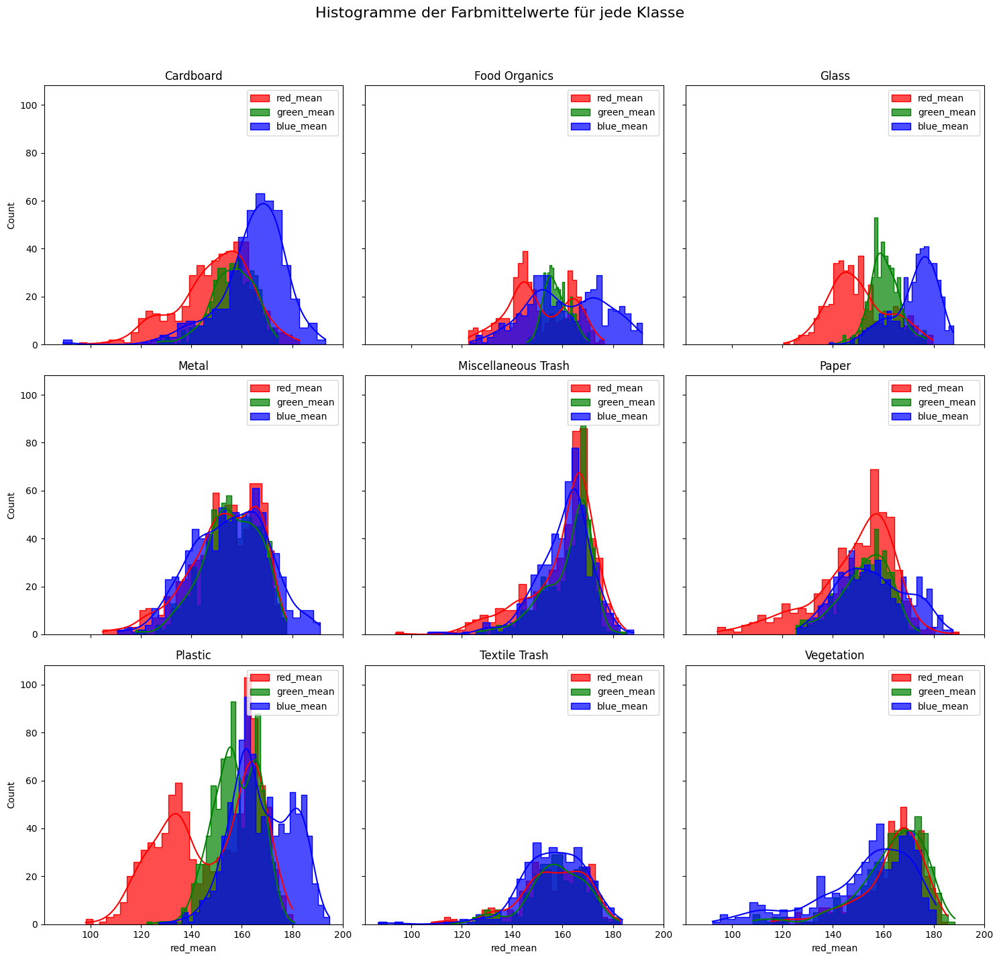

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

# Eindeutige Labels extrahieren
labels = df_features_reduced_combined_labeled['label'].unique()

# Farben definieren
colors = {'red_mean': 'red', 'green_mean': 'green', 'blue_mean': 'blue'}

# Figure und Axes für die 3x3-Matrix erstellen
fig, axes = plt.subplots(3, 3, figsize=(15, 15), sharex=True, sharey=True)

# Flaches Array aus Axes für einfacheren Zugriff
axes_flat = axes.flatten()

# Für jedes Label und jeden entsprechenden Subplot ein Histogramm der Farbmittelwerte erzeugen
for i, label in enumerate(labels):
    ax = axes_flat[i]
    for color_mean in ['red_mean', 'green_mean', 'blue_mean']:
        sns.histplot(df_features_reduced_combined_labeled[df_features_reduced_combined_labeled['label'] == label][color_mean], color=colors[color_mean], label=color_mean, kde=True, element='step', alpha=0.7, bins=30, ax=ax)
    ax.set_title(label)
    ax.legend()

# Überschrift für die gesamte Figure setzen
fig.suptitle('Histogramme der Farbmittelwerte für jede Klasse', fontsize=16)

# Anpassung des Layouts für bessere Darstellung
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


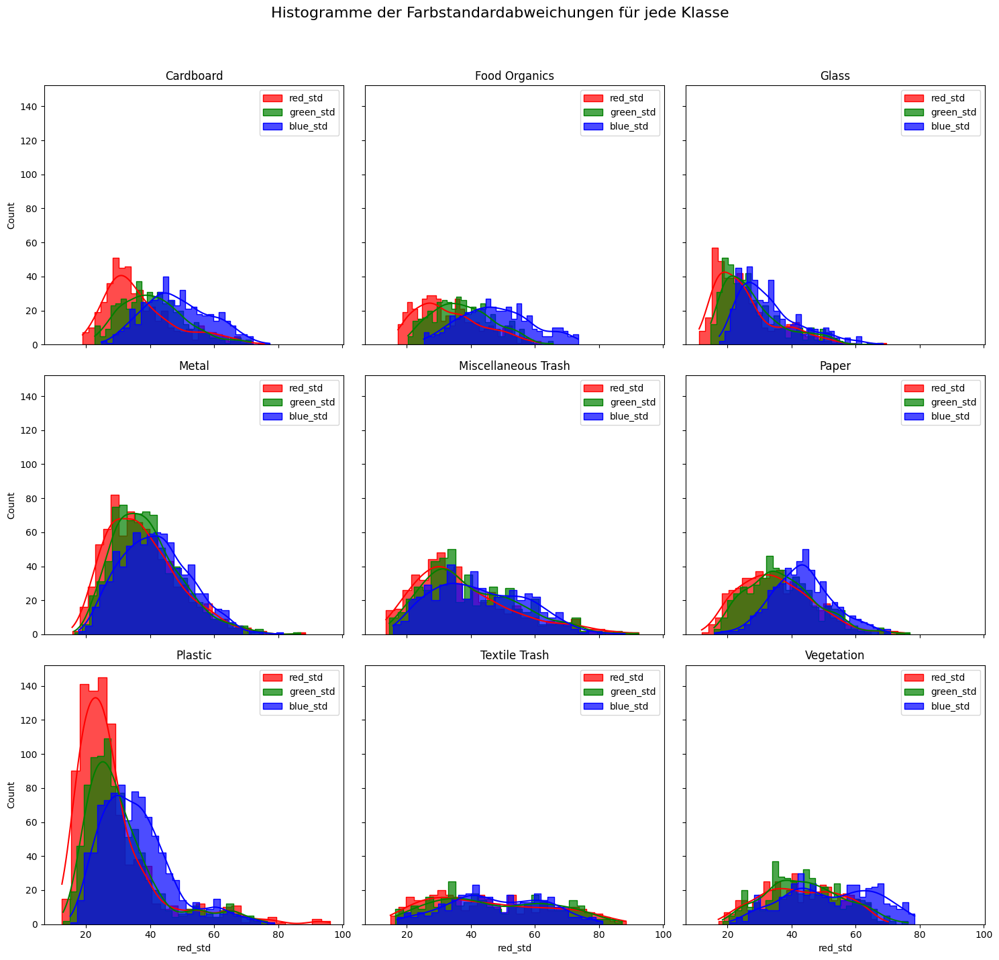

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Eindeutige Labels extrahieren
labels = df_features_reduced_combined_labeled['label'].unique()

# Farben für die Standardabweichungen definieren
colors_std = {'red_std': 'red', 'green_std': 'green', 'blue_std': 'blue'}

# Figure und Axes für die 3x3-Matrix erstellen (für Standardabweichungen)
fig_std, axes_std = plt.subplots(3, 3, figsize=(15, 15), sharex=True, sharey=True)

# Flaches Array aus Axes für einfacheren Zugriff
axes_flat_std = axes_std.flatten()

# Für jedes Label und jeden entsprechenden Subplot ein Histogramm der Standardabweichungen erstellen
for i, label in enumerate(labels):
    ax = axes_flat_std[i]
    for color_std in ['red_std', 'green_std', 'blue_std']:
        sns.histplot(df_features_reduced_combined_labeled[df_features_reduced_combined_labeled['label'] == label][color_std], color=colors_std[color_std], label=color_std, kde=True, element='step', alpha=0.7, bins=30, ax=ax)
    ax.set_title(label)
    ax.legend()

# Überschrift für die gesamte Figure setzen
fig_std.suptitle('Histogramme der Farbstandardabweichungen für jede Klasse', fontsize=16)

# Anpassung des Layouts für bessere Darstellung
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


#### Kantenfeature visualisieren

##### Ergebnisse für Sobel-Filter visuell ausgeben

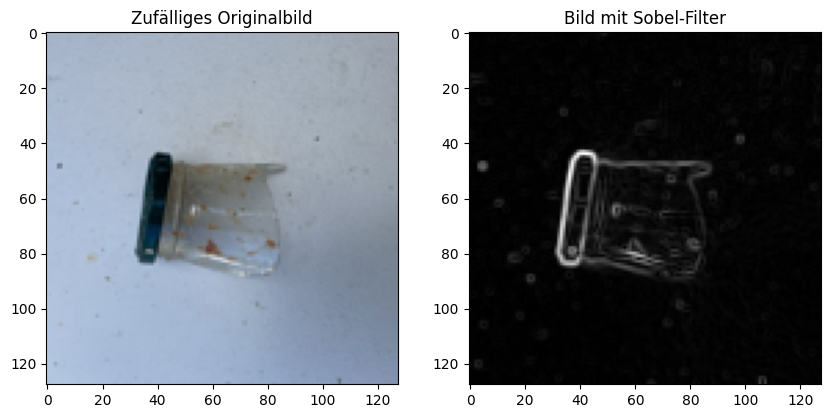

In [47]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
import random

def apply_sobel_filter(image):
    """Wendet den Sobel-Filter auf ein Bild an und gibt das Ergebnis zurück."""
    # Konvertiere das Bild für den Sobel-Filter zuerst in Graustufen
    if image.ndim == 3 and image.shape[2] == 3:
        image_gray = np.mean(image, axis=2)
    else:
        image_gray = image
    image_gray = image_gray.astype(np.float32)

    sobel_x = ndimage.sobel(image_gray, axis=0)  # Sobel-Filter in x-Richtung
    sobel_y = ndimage.sobel(image_gray, axis=1)  # Sobel-Filter in y-Richtung

    # Berechne die Magnitude der Kanten
    sobel_magnitude = np.hypot(sobel_x, sobel_y)

    # Optional: Normalisiere das Ergebnis für die Anzeige
    sobel_magnitude = sobel_magnitude / np.max(sobel_magnitude)

    return sobel_magnitude

# Wähle zufällig eine Klasse und ein Bild aus dieser Klasse
random_class_name = random.choice(list(images_resized.keys()))
random_image = random.choice(images_resized[random_class_name])

# Wende den Sobel-Filter an, der das Bild automatisch zu Graustufen konvertiert
sobel_filtered_image = apply_sobel_filter(random_image)

# Zeige das Originalbild in seiner ursprünglichen Farbform und das gefilterte Bild in Graustufen
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
if random_image.ndim == 3:
    plt.imshow(random_image.astype(np.uint8))  # Stelle sicher, dass wir uint8 für Farbbilder verwenden
else:
    plt.imshow(random_image, cmap='gray')  # Für den Fall, dass das Bild bereits in Graustufen ist
plt.title('Zufälliges Originalbild')

plt.subplot(1, 2, 2)
plt.imshow(sobel_filtered_image, cmap='gray')
plt.title('Bild mit Sobel-Filter')

plt.show()


##### Sobel-Summen mit Histogramm plotten

In [48]:
sobel_sums_labeled = pd.DataFrame({
    'sobel_sum': sobel_filtered_images_sums,
    'label': label_array
})

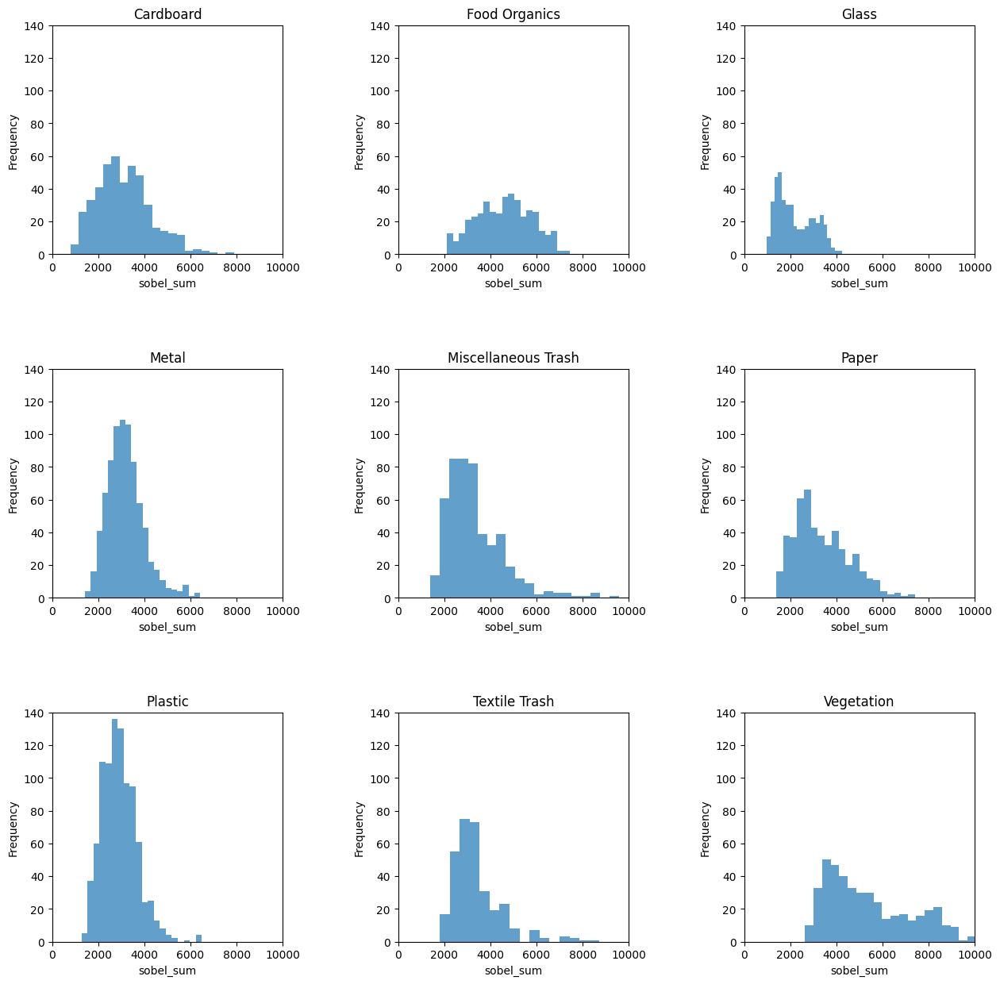

In [49]:
import matplotlib.pyplot as plt
import pandas as pd

df_sobelsums_labeled = pd.DataFrame(sobel_sums_labeled)

# Einzigartige Labels extrahieren
labels = df_sobelsums_labeled['label'].unique()

# Plot-Einstellungen
fig, axs = plt.subplots(3, 3, figsize=(15, 15))  # 3x3 Matrix von Subplots
fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Einstellung des Abstands zwischen den Plots
axs = axs.ravel()  # Umwandlung in ein 1D Array für einfachen Zugriff

for i, label in enumerate(labels):
    subset = df_sobelsums_labeled[df_sobelsums_labeled['label'] == label]
    axs[i].hist(subset['sobel_sum'], bins=20, alpha=0.7)
    axs[i].set_title(f'{label}')
    axs[i].set_xlabel('sobel_sum')
    axs[i].set_ylabel('Frequency')
    axs[i].set_xlim(0, 10000)  # Setze die Grenzen der X-Achse einheitlich für alle Plots auf 0 bis 10000
    axs[i].set_ylim(0, 140) # Setze die Grenzen der Y-Achse einheitlich für alle Plots auf 0 bis 140 (jetzt passt auch plastic drauf)

plt.show()

#### Texturfeature visualisieren

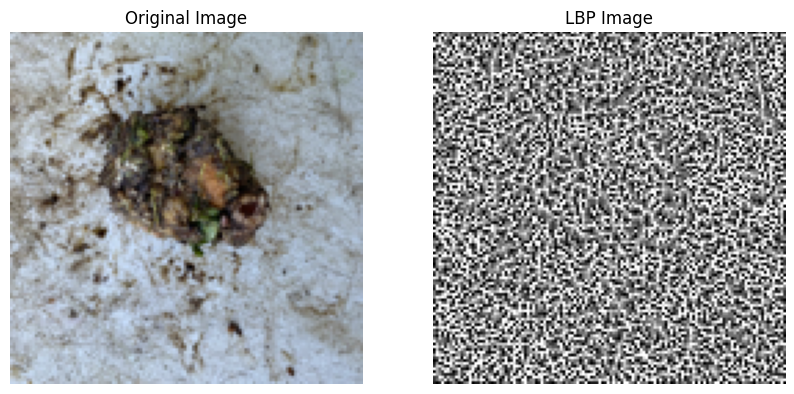

In [50]:
import matplotlib.pyplot as plt
import numpy as np
import random
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray

def show_random_image_and_its_lbp(images_resized):
    # Zufällige Klasse auswählen
    class_name = random.choice(list(images_resized.keys()))
    # Zufälliges Bild aus dieser Klasse auswählen
    image_index = random.randint(0, len(images_resized[class_name]) - 1)
    original_image = images_resized[class_name][image_index]

    # Umwandlung in Graustufen
    img_gray = rgb2gray(original_image)
    # Berechnung des LBP
    lbp = local_binary_pattern(img_gray, P, R, method="uniform")

    # Visualisierung
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(original_image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(lbp, cmap='gray')
    ax[1].set_title('LBP Image')
    ax[1].axis('off')

    plt.show()

# P und R Parameter setzen
P = 8  # Anzahl der kreisförmigen Nachbarn
R = 1  # Radius

# Funktion aufrufen
show_random_image_and_its_lbp(images_resized)

In [51]:
feature_array_lbp.shape

(4752, 10)

In [52]:
import pandas as pd
import numpy as np

# Erstelle einen DataFrame aus dem feature_array_lbp
df_lbp = pd.DataFrame(feature_array_lbp, columns=[f'lbp_{i}' for i in range(feature_array_lbp.shape[1])])

# Füge die Labels als neue Spalte hinzu
df_lbp['label'] = label_array

# Ergebnis überprüfen
print(df_lbp.head(5))  # Zeigt die ersten fünf Zeilen des DataFrame zur Überprüfung

      lbp_0     lbp_1     lbp_2     lbp_3     lbp_4     lbp_5     lbp_6  \
0  0.063293  0.085449  0.050110  0.088562  0.163330  0.097778  0.070496   
1  0.054871  0.085266  0.043640  0.092163  0.121277  0.124207  0.074707   
2  0.112427  0.099182  0.074463  0.082214  0.091187  0.087952  0.074402   
3  0.065918  0.077576  0.051392  0.103821  0.173096  0.107544  0.067993   
4  0.104065  0.096863  0.073303  0.092285  0.103516  0.097717  0.078369   

      lbp_7     lbp_8     lbp_9      label  
0  0.088562  0.117676  0.174744  Cardboard  
1  0.096680  0.131836  0.175354  Cardboard  
2  0.094421  0.099915  0.183838  Cardboard  
3  0.082764  0.105530  0.164368  Cardboard  
4  0.086548  0.095093  0.172241  Cardboard  


In [53]:
df_lbp.shape

(4752, 11)

### Erstellung eines Dataframes mit den extrahierten Features in aggregierter Form

In [25]:
def add_lbp_features_to_dataframe(features_df, lbp_features_array, P):
    # Generate column names for LBP features based on their position in the histogram
    lbp_columns = [f'lbp_{i}' for i in range(P + 2)]

    # Create a DataFrame from the LBP features array with these column names
    lbp_df = pd.DataFrame(lbp_features_array, columns=lbp_columns)

    # Concatenate this DataFrame with the existing features DataFrame
    enhanced_features_df = pd.concat([features_df, lbp_df], axis=1)

    return enhanced_features_df

# Add LBP features to the DataFrame
df_features_reduced_combined = add_lbp_features_to_dataframe(df_features_reduced_combined, feature_array_lbp, P)
df_features_reduced_combined

,red_mean,red_std,green_mean,green_std,blue_mean,blue_std,sobel_sum,lbp_0,lbp_1,lbp_2,lbp_3,lbp_4,lbp_5,lbp_6,lbp_7,lbp_8,lbp_9
0,168.503540,32.215154,170.616028,36.638167,171.028564,44.670467,1551.500188,0.063293,0.085449,0.050110,0.088562,0.163330,0.097778,0.070496,0.088562,0.117676,0.174744
1,173.499939,39.203376,172.930908,43.416050,167.939941,50.787999,1685.084060,0.054871,0.085266,0.043640,0.092163,0.121277,0.124207,0.074707,0.096680,0.131836,0.175354
2,151.504333,25.128986,159.249634,30.561417,168.499756,38.381649,3401.464125,0.112427,0.099182,0.074463,0.082214,0.091187,0.087952,0.074402,0.094421,0.099915,0.183838
3,159.893921,35.130216,165.596924,44.562195,171.897034,57.273066,2822.211584,0.065918,0.077576,0.051392,0.103821,0.173096,0.107544,0.067993,0.082764,0.105530,0.164368
4,146.946960,24.629529,156.082642,31.644635,168.250244,40.639512,3422.139641,0.104065,0.096863,0.073303,0.092285,0.103516,0.097717,0.078369,0.086548,0.095093,0.172241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4747,151.340454,59.774400,148.608154,61.164567,134.677368,68.175550,6833.218504,0.112793,0.106140,0.072205,0.075378,0.090820,0.085937,0.075134,0.095581,0.100220,0.185791
4748,151.768494,60.347893,149.364807,61.510328,135.527344,68.372839,6886.802388,0.113708,0.101929,0.077454,0.080505,0.084167,0.086853,0.075073,0.095825,0.100830,0.183655
4749,154.951416,59.333166,152.153076,61.195001,137.555908,69.744840,6729.545094,0.110168,0.105225,0.075500,0.081055,0.088989,0.089783,0.074707,0.092957,0.098328,0.183289
4750,154.458679,57.086545,152.926086,58.102958,141.966736,64.977466,6591.700920,0.113525,0.104004,0.074646,0.076172,0.088196,0.086426,0.078186,0.092590,0.099854,0.186401


### Chi^2-Unabhängigkeitstest: Prüfung der Relevanz der aggregierten, extrahierten Features

Der Chi-Quadrat-Unabhängigkeitstest Test, ein nicht-parametrisches Verfahren, dient in der vorliegenden Ausarbeitung dazu, die Unabhängigkeit zwischen den extrahierten Features und der Zielvariable (Labels für die Klassen) zu bewerten. Dies ermöglicht es uns, Merkmale zu selektieren, die statistisch signifikante Unterschiede in Bezug auf die Zielvariable aufzeigen. Vor der Anwendung des Tests ist jedoch eine Vorverarbeitung der Daten notwendig. Da der Chi-Quadrat Test ausschließlich mit nichtnegativen Werten arbeitet, wird für die entsprechende Skalierung der Daten der MinMaxScaler eingesetzt.

Die Ergebnisse des Chi-Quadrat-Unabhängigkeitstest werden zudem in Form eines absteigenden Balkendiagramms visualisiert, um ein klares Bild über die Relevanz der extrahierten Merkmale zu gewinnen. Diese methodische Herangehensweise ermöglicht es uns, die Datenstruktur eingehender zu verstehen und informierte Entscheidungen für die Entwicklung robuster maschineller Lernmodelle zu treffen.

Im Rahmen der Erarbeitung der vorliegenden EDA wurde mit der Extraktion verschiedener Features aus dem RealWaste-Datensatz experimentiert. In der finalen Abgabeform beschränkt sich die Ausarbeitung lediglich auf die weiterführende Untersuchung der bereits angesprochenen Farb-, Kanten- und Konturfeatures. Aufgrund der überschaubaren Anzahl der verbleibenden Features kann für die nachfolgende Funktion, welche die 'k' besten Features extrahiert, der Parameter k='all' gesetzt werden.

Das Visualisierungsergebnis zeigt sowohl für Farb-, Kanten-, als auch Texturfeatures mindestens mittelhohe Chi-Quadrat-Werte. Insbesondere die sobel_sum sowie die Standardabweichungen für die Farbkanäle weisen hohe Chi-Quadrat-Werte auf. dass die Wahrscheinlichkeit geringer ist, dass die beobachtete Assoziation zwischen diesem Feature und der Zielvariable zufällig ist. <br>

Für weiterführende Untersuchungen wird auf Grundlage des durchgeführten Chi-Quadrat-Unabhängigkeitstests davon ausgegangen, dass diese extrahierten Features für das Training von Modellen nützlich sind.

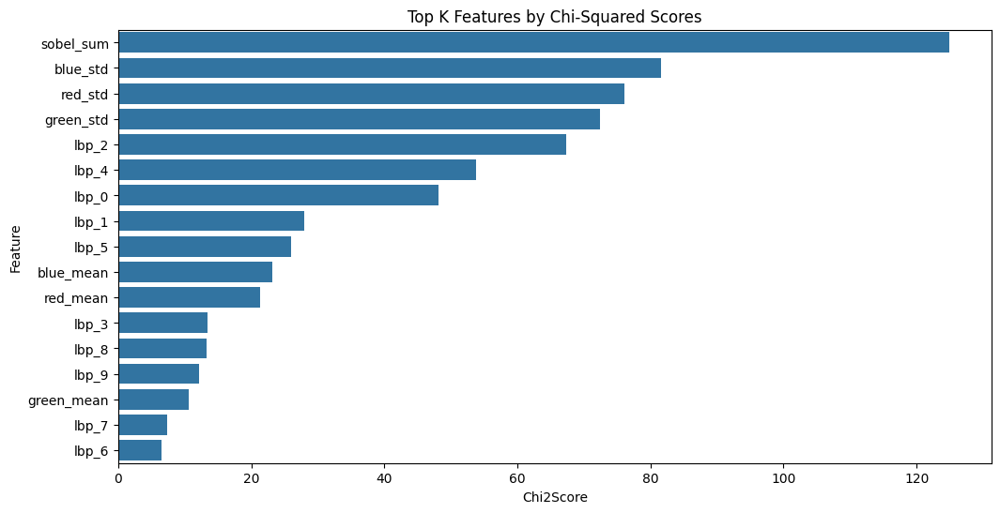

In [26]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, chi2
import matplotlib.pyplot as plt
import seaborn as sns

def preprocess_features_non_negative(X):
    scaler = MinMaxScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
    return X_scaled

def select_and_visualize_chi_squared_top_features(X, y, k='all'):  # für die k-besten Merkmale nimm hier alle
    # Initialisiere SelectKBest mit der Chi-Quadrat Score-Funktion
    chi2_selector = SelectKBest(chi2, k=k)

    # Passe das Modell an die Daten an und transformiere es, um die Top-k-Merkmale auszuwählen
    X_kbest = chi2_selector.fit_transform(X, y)

     # Hole die Scores für die Merkmale
    chi_scores = chi2_selector.scores_

    # Erstelle ein DataFrame, um die Feature-Scores zu halten
    chi_scores_df = pd.DataFrame({'Feature': X.columns, 'Chi2Score': chi_scores})
    # Sortiere das DataFrame nach den Chi-Quadrat Scores in absteigender Reihenfolge
    chi_scores_df = chi_scores_df.sort_values(by='Chi2Score', ascending=False)

    if isinstance(k, int):  # Wenn k ein Integer ist, begrenze die Anzahl der dargestellten Features
        chi_scores_df = chi_scores_df.head(k)

    # Plotting
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Chi2Score', y='Feature', data=chi_scores_df, orient='h')
    plt.title('Top K Features by Chi-Squared Scores')
    plt.show()

    return X_kbest, chi_scores_df

# Vorverarbeitung der Features für den Einsatz mit Chi^2: Die Features dürfen nicht negativ sein
df_features_reduced_combined_non_negative = preprocess_features_non_negative(df_features_reduced_combined)

# Anwenden der Chi^2-Funktion
X_kbest, chi_scores_df = select_and_visualize_chi_squared_top_features(df_features_reduced_combined_non_negative, label_array)


## Principal Component Analyse (PCA) auf die aggregierten, extrahierten Features anwenden

Die Principal Component Analyse (PCA) ist eine Technik zur Dimensionsreduktion (vgl. sklearn [(2024a)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)). Die Dimensionen eines Datensatzes können im Rahmen einer PCA verringert werden, indem der Datensatz in einen kleineren Satz von Variablen transformiert wird (vgl. ebd.). Diese Transformation geht mit einem Informationsverlust einher, zielt aber darauf ab, einen Großteil der Informationen (Varianz) des Originaldatensatzes zu bewahren (vgl. ebd.).

Die zuvor aus dem RealWaste-Datensatz extrahierten Features zu Farben, Kanten und Textur werden nachfolgend mithilfe einer PCA auf 3 Dimensionen reduziert.

In der nachfolgend aufgeführten dreidimensionalen Visualisierung für die durchgeführte PCA können in der Punktwolke für einige Klassen bereits zusammenhängende Punkthäufungen identifiziert werden. Dies ist beispielsweise gut erkennbar für _Glass_ oder _Vegetation_. <br>
Wenngleich die Punktwolken der einzelnen Klassen noch immer eine deutliche Überlappung zueinander aufweisen, kann die vorliegende PCA die Vermutung stützen, dass die extrahierten Featues für _Farben_, _Kanten_ und _Textur_ in ihrer zuvor erarbeiteten Form vermutlich einen Beitrag zur erfolgreichen Klassifikation der Bilder aus dem RealWaste-Datensatz beitragen können.


***
**Quellen:**
* sklearn (2024a): Dokumentation zu scikit-learn - Decomposition PCA <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
***

In [27]:
from sklearn.decomposition import PCA
import plotly.express as px
import pandas as pd

# PCA initialisieren und Anzahl der Komponenten festlegen
pca = PCA(n_components=3)

X_pca = pca.fit_transform(df_features_reduced_combined_non_negative)

# Data Frame erzeugen, um die PCA-Ergebnisse plotten zu können
pca_df = pd.DataFrame(data = X_pca, columns = ['Principal Component 1', 'Principal Component 2', 'Principal Component 3'])

# DF für die Labels erzeugen
pca_df['Label'] = label_array

# Interactive 3D scatter plot using Plotly
fig = px.scatter_3d(pca_df, x='Principal Component 1', y='Principal Component 2', z='Principal Component 3',
                    color='Label', color_continuous_scale=px.colors.sequential.Viridis,
                    title="PCA 3D Visualization")

fig.update_layout(width=1000, height=800)

# Kameraeinstellungen anpassen für die initiale Ansicht
fig.update_layout(scene_camera=dict(
    eye=dict(x=-2, y=-2, z=1)  # Werte für die initiale Ansicht anpassen
))

fig.show()


# Klassische ML-Modelle

Die Klassifikationsmethode _Nearest Neighbor_ ordnet einen unklassifizierten Punkt die Klasse des nächsten Punktes aus einer Gruppe zuvor klassifizierter Punkte zu (vgl. Cover u. Hart [(1967)](https://doi.org/10.1109/TIT.1967.1053964), S. 21). Die Methode ist in ihrer Fehleranfälligkeit begrenzt, etwa die Hälfte der Informationen für eine korrekte Klassifizierung liegen in der direkten Umgebung eines Punktes (vgl. ebd.). Der Punktabstand kann hierbei ein beliebiges metrisches Maß sein, häufig kommt der euklidische Standardabstand die häufigste Wahl (vgl. sklearn [(2024b)](https://scikit-learn.org/stable/modules/neighbors.html)). Die Methoden hat sich trotz ihrer Einfachheit für Klassifizierungs- und auch für Regressionsprobleme bewährt (vgl. ebd.). Die Eigenschaft als nichtparametrisches Verfahren macht es oftmals in Klassifizierungssituationen erfolgsversprechend, die eine unregelmäßige _decision broundry_ aufweisen (vgl. ebd.).


Bei _Random Forests_ handelt es sich um eine Kombination von Entscheidungsbaumprädiktoren, bei welcher jeder Entscheidungsbaum von den Werten eines Zufallsvektors abhängt (vgl. Breiman [(2001)](https://doi.org/10.1023/A:1010933404324), S. 5). Die Methode ist gut für Klassifikationsaufgaben geeignet und erweist sich als robust gegenüber Rauschen (vgl. ebd., S. 32). Die Bäume werden durch das Finden der besten Aufteilung unter allen Merkmalen oder einer zufälligen Teilmenge konstruiert, mit dem Ziel, die Varianz des Waldschätzers zu verringern (vgl. sklearn [(2024c)](https://scikit-learn.org/stable/modules/ensemble.html#random-forests-and-other-randomized-tree-ensembles)).
Die eingeführte Zufälligkeit bei der Baumkonstruktion hilft, Überanpassung zu reduzieren, indem Vorhersagefehler entkoppelt werden, was eine Varianzreduktion bei einer potenziell leichten Erhöhung des Bias ermöglicht (vgl. ebd.).

_Support Vector Machines_ (SVM) sind ein leistungsstarkes Verfahren in der Klassifikation, das auf flexiblen Trennlinien basiert (vgl. Von der Hude [(2020)](http://link.springer.com/10.1007/978-3-658-30153-8_13), S. 179). Im Gegensatz zu Klassifikationsbäumen, bei denen die Klassen durch Regeln zugewiesen werden, ermöglichen SVMs die Bestimmung von Grenzen mittels mathematischer Optimierungsverfahren (vgl. ebd.). Diese Grenzen können beliebig geformt sein und sind nicht auf lineare Trennungen beschränkt (vgl. ebd.). SVMs sind zunächst für die Zweiklassenklassifikation konzipiert, können jedoch problemlos auf Mehrklassenprobleme erweitert werden (vgl. ebd.). Klassenhäufigkeiten oder -wahrscheinlichkeiten werden bei der Grenzbestimmung nicht berücksichtigt (vgl. ebd.).

***
**Quellen:**
* Cortes, C., & Vapnik, V. (1995). Support-Vector Networks. Machine Learning, 20, 273-297. <br>
https://doi.org/10.1023/A:1022627411411
* Cover, T., & Hart, P. (1967). Nearest neighbor pattern classification. IEEE Trans. Inf. Theory, 13, 21-27. <br> https://doi.org/10.1109/TIT.1967.1053964
* Breiman, L. (2001). Random Forests. Machine Learning, 45, 5-32. <br> https://doi.org/10.1023/A:1010933404324
* sklearn (2024b): Dokumentation zu scikit-learn - Nearest Neigbors <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/neighbors.html
* sklearn (2024c): Dokumentation zun scikit-learn - Random Forest <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/ensemble.html#random-forests-and-other-randomized-tree-ensembles
* ~sklearn (2024c): Dokumentation zu scikit-learn - Support Vector Machines <br>
Abgerufen am 28.02.2024 unter: <br>
https://scikit-learn.org/stable/modules/svm.html#support-vector-machines~
* Von der Hude, M. (2020). Support-Vector-Machines. 179-199. <br>
http://link.springer.com/10.1007/978-3-658-30153-8_13


## Aufteilung Trainings- und Testdatensatz

In [28]:
from sklearn.model_selection import StratifiedShuffleSplit

def stratified_shuffle_split(X, y, test_size=0.2, random_state=42):
    sss = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)

    for train_index, test_index in sss.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = stratified_shuffle_split(df_features_reduced_combined_non_negative.to_numpy(), label_array, test_size=0.2, random_state=42)

## Modelltraining durchführen

In [29]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

def train_and_evaluate(X_train, X_test, y_train, y_test):
    # Initialisierung der Modelle
    models = {
        "KNN": KNeighborsClassifier(),
        "SVM": SVC(),
        "Random Forest": RandomForestClassifier(random_state=42)
    }

    # Training der Modelle und Auswertung
    for name, model in models.items():
        model.fit(X_train, y_train)  # Training
        y_pred = model.predict(X_test)  # Vorhersage

        print(f"=== {name} ===")
        print("Accuracy Score:", accuracy_score(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("\n")

#### Klassifikationsberichte, basierend auf der aggregierten Extraktion von Features

In [30]:
train_and_evaluate(X_train, X_test, y_train, y_test)

=== KNN ===
Accuracy Score: 0.6288117770767613
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.64      0.72      0.68        92
      Food Organics       0.64      0.73      0.68        82
              Glass       0.69      0.77      0.73        84
              Metal       0.57      0.65      0.60       158
Miscellaneous Trash       0.51      0.48      0.49        99
              Paper       0.58      0.43      0.49       100
            Plastic       0.64      0.59      0.61       185
      Textile Trash       0.58      0.44      0.50        64
         Vegetation       0.83      0.89      0.86        87

           accuracy                           0.63       951
          macro avg       0.63      0.63      0.63       951
       weighted avg       0.63      0.63      0.62       951



=== SVM ===
Accuracy Score: 0.5814931650893796
Classification Report:
                     precision    recall  f1-score   support



## Hyperparameter-Tuning, Kreuzvalidierung und Ergebnisvisualisierung

In [31]:
print(np.unique(label_array))

['Cardboard' 'Food Organics' 'Glass' 'Metal' 'Miscellaneous Trash' 'Paper'
 'Plastic' 'Textile Trash' 'Vegetation']


=== KNN ===
Best parameters: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
Best cross-validation accuracy: 0.6669320146621481
Test set accuracy: 0.647739221871714
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.72      0.65      0.69        92
      Food Organics       0.75      0.68      0.71        82
              Glass       0.81      0.79      0.80        84
              Metal       0.58      0.61      0.59       158
Miscellaneous Trash       0.53      0.52      0.52        99
              Paper       0.57      0.50      0.53       100
            Plastic       0.61      0.66      0.64       185
      Textile Trash       0.56      0.55      0.55        64
         Vegetation       0.80      0.91      0.85        87

           accuracy                           0.65       951
          macro avg       0.66      0.65      0.65       951
       weighted avg       0.65      0.65      0.65       951


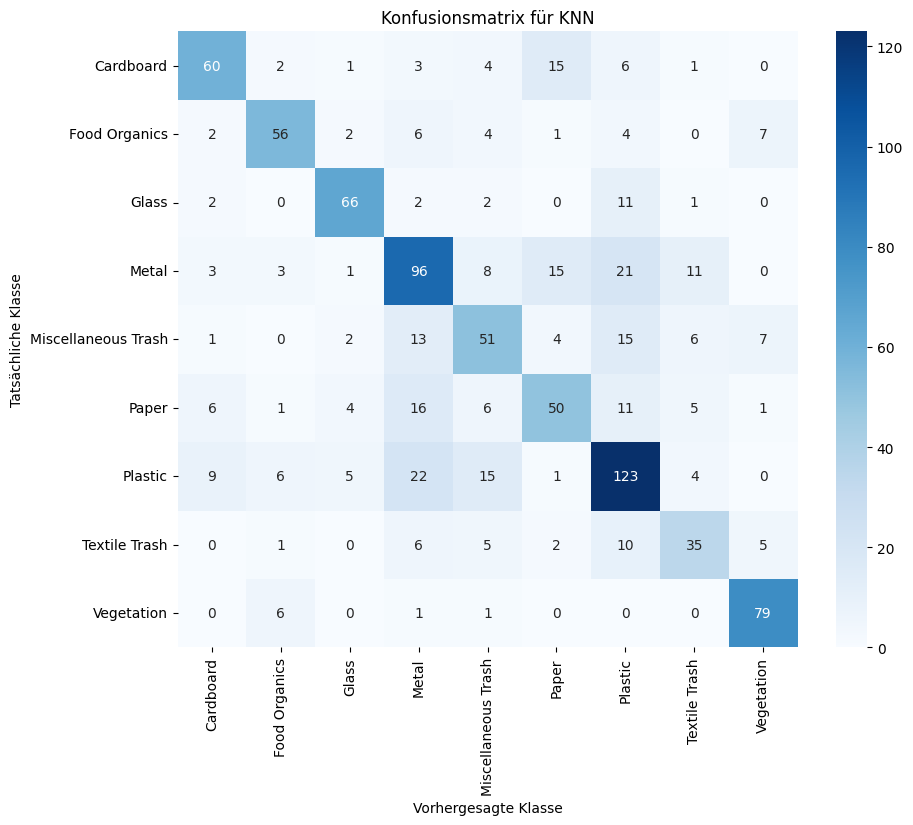

=== SVM ===
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best cross-validation accuracy: 0.6595594439449478
Test set accuracy: 0.6393270241850684
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.75      0.68      0.72        92
      Food Organics       0.73      0.80      0.76        82
              Glass       0.74      0.58      0.65        84
              Metal       0.60      0.65      0.62       158
Miscellaneous Trash       0.43      0.40      0.41        99
              Paper       0.58      0.52      0.55       100
            Plastic       0.59      0.73      0.65       185
      Textile Trash       0.74      0.36      0.48        64
         Vegetation       0.82      0.89      0.85        87

           accuracy                           0.64       951
          macro avg       0.66      0.62      0.63       951
       weighted avg       0.64      0.64      0.63       951





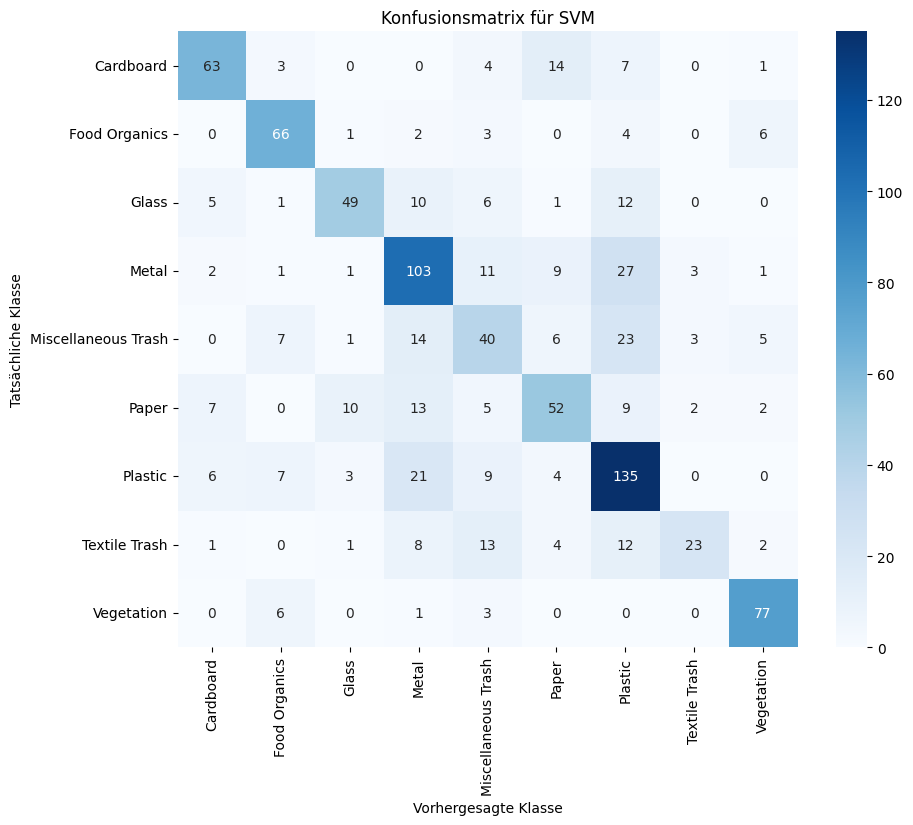

=== Random Forest ===
Best parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation accuracy: 0.6658786914724393
Test set accuracy: 0.6624605678233438
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.74      0.72      0.73        92
      Food Organics       0.79      0.73      0.76        82
              Glass       0.83      0.65      0.73        84
              Metal       0.57      0.66      0.62       158
Miscellaneous Trash       0.58      0.47      0.52        99
              Paper       0.62      0.48      0.54       100
            Plastic       0.61      0.78      0.69       185
      Textile Trash       0.67      0.41      0.50        64
         Vegetation       0.76      0.91      0.83        87

           accuracy                           0.66       951
          macro avg       0.69      0.65      0.66       951
       weighted avg       0.67      0.66      0.66  

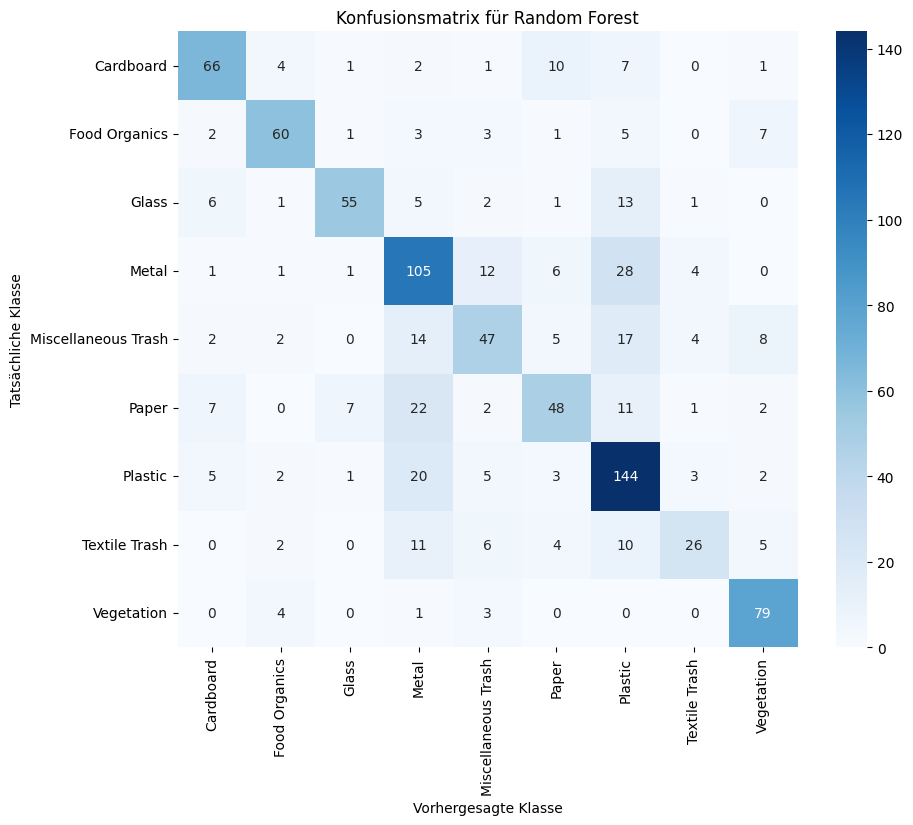

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Definiere die Klassenbeschriftungen
class_labels = np.unique(label_array)

def train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test):
    model_params = {
        "KNN": {
            "model": KNeighborsClassifier(),
            "params": {
                "n_neighbors": [3, 5, 7, 9],
                "weights": ["uniform", "distance"],
                "metric": ["euclidean", "manhattan"]
            }
        },
        "SVM": {
            "model": SVC(),
            "params": {
                "C": [0.1, 1, 10],
                "kernel": ["rbf", "linear"],
                "gamma": ["scale", "auto"]
            }
        },
        "Random Forest": {
            "model": RandomForestClassifier(random_state=42),
            "params": {
                "n_estimators": [10, 50, 100],
                "max_depth": [None, 10, 20, 30],
                "min_samples_split": [2, 5, 10]
            }
        }
    }

    for name, mp in model_params.items():
        clf = GridSearchCV(mp["model"], mp["params"], cv=5, scoring='accuracy')
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        print(f"=== {name} ===")
        print("Best parameters:", clf.best_params_)
        print("Best cross-validation accuracy:", clf.best_score_)
        print("Test set accuracy:", accuracy_score(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred, target_names=class_labels))
        print("\n")

        # Konfusionsmatrix erstellen
        cm = confusion_matrix(y_test, y_pred)

        # Konfusionsmatrix visualisieren
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
        plt.title(f'Konfusionsmatrix für {name}')
        plt.ylabel('Tatsächliche Klasse')
        plt.xlabel('Vorhergesagte Klasse')
        plt.show()



# Modelltraining mit Hyperparameter-Tuning und Kreuzvalidierung durchführen
train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test)

# (Noch) nicht verwendet

## Hyperparamter Tuning alt

### Training mit Hyperparameter Tunning und Kreuzvalidierung

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

def train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test):
    # Modelle mit zugehörigen Hyperparameter-Grids
    model_params = {
        "KNN": {
            "model": KNeighborsClassifier(),
            "params": {
                "n_neighbors": [3, 5, 7, 9],
                "weights": ["uniform", "distance"],
                "metric": ["euclidean", "manhattan"]
            }
        },
        "SVM": {
            "model": SVC(),
            "params": {
                "C": [0.1, 1, 10],
                "kernel": ["rbf", "linear"],
                "gamma": ["scale", "auto"]
            }
        },
        "Random Forest": {
            "model": RandomForestClassifier(random_state=42),
            "params": {
                "n_estimators": [10, 50, 100],
                "max_depth": [None, 10, 20, 30],
                "min_samples_split": [2, 5, 10]
            }
        }
    }

    # Hyperparameter tuning and evaluation
    for name, mp in model_params.items():
        clf = GridSearchCV(mp["model"], mp["params"], cv=5, scoring='accuracy') # cross-validation
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        print(f"=== {name} ===")
        print("Best parameters:", clf.best_params_)
        print("Best cross-validation accuracy:", clf.best_score_)
        print("Test set accuracy:", accuracy_score(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("\n")

In [ ]:
train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test)

=== KNN ===
Best parameters: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
Best cross-validation accuracy: 0.6669320146621481
Test set accuracy: 0.647739221871714
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.72      0.65      0.69        92
      Food Organics       0.75      0.68      0.71        82
              Glass       0.81      0.79      0.80        84
              Metal       0.58      0.61      0.59       158
Miscellaneous Trash       0.53      0.52      0.52        99
              Paper       0.57      0.50      0.53       100
            Plastic       0.61      0.66      0.64       185
      Textile Trash       0.56      0.55      0.55        64
         Vegetation       0.80      0.91      0.85        87

           accuracy                           0.65       951
          macro avg       0.66      0.65      0.65       951
       weighted avg       0.65      0.65      0.65       951


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

def train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test):
    # Modelle mit zugehörigen Hyperparameter-Grids
    model_params = {
        "KNN": {
            "model": KNeighborsClassifier(),
            "params": {
                "n_neighbors": [3, 5, 7, 9],
                "weights": ["uniform", "distance"],
                "metric": ["euclidean", "manhattan"]
            }
        },
        "SVM": {
            "model": SVC(),
            "params": {
                "C": [0.1, 1, 10],
                "kernel": ["rbf", "linear"],
                "gamma": ["scale", "auto"]
            }
        },
        "Random Forest": {
            "model": RandomForestClassifier(random_state=42),
            "params": {
                "n_estimators": [10, 50, 100],
                "max_depth": [None, 10, 20, 30],
                "min_samples_split": [2, 5, 10]
            }
        }
    }

    for name, mp in model_params.items():
        clf = GridSearchCV(mp["model"], mp["params"], cv=5, scoring='accuracy')
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)  # Hier wird y_pred definiert

        # Konfusionsmatrix erstellen
        cm = confusion_matrix(y_test, y_pred)

        # Konfusionsmatrix visualisieren
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Predicted 0", "Predicted 1"], yticklabels=["Actual 0", "Actual 1"])
        plt.title(f'Konfusionsmatrix für {name}')
        plt.ylabel('Tatsächliche Klasse')
        plt.xlabel('Vorhergesagte Klasse')
        plt.show()

        print(f"=== {name} ===")
        print("Best parameters:", clf.best_params_)
        print("Best cross-validation accuracy:", clf.best_score_)
        print("Test set accuracy:", accuracy_score(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("\n")

# Aufruf der Funktion mit den entsprechenden Parametern
train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test)

### Standardisierung der Feature-Arrays (Z-Transformation)

In [ ]:
# Features normalisieren (Z-Score-Normalisierung)
# Funktion zur Durchführung der Z-Score-Normalisierung
# z=\frac{x-\mu}{\sigma}

import numpy as np

def standardize_features(feature_array):
    # Berechne den Mittelwert und die Standardabweichung für jedes Feature
    mean = np.mean(feature_array, axis=0)
    std = np.std(feature_array, axis=0)

    # Vermeide Division durch Null, indem man dort, wo std Null ist, Einsen setzt
    std[std == 0] = 1

    # Führe die Z-Score-Normalisierung durch
    standardized_array = (feature_array - mean) / std

    return standardized_array

Standardisierungsfunktion auf die einzelnen extrahierten Features anwenden:

In [ ]:
# Standardisierungsfunktion auf das Farbfeature anwenden
standardized_feature_array_colorhist = standardize_features(feature_array_colorhist)

In [ ]:
# Standardisierungsfunktion für den Sobel-Array anwenden
standardized_feature_array_edges = standardize_features(feature_array_sobel)

In [ ]:
# Standardisierungsfunktion für die Local-Binary-Patterns
standardized_feature_array_lbp = standardize_features(feature_array_lbp)

#### Standardisierte Feature-Arrays zusammenführen

In [ ]:
standardised_feature_array_combined = np.hstack((standardized_feature_array_colorhist, standardized_feature_array_edges, standardized_feature_array_lbp))

## Weiterführende Untersuchungen (noch in Arbeit)


### Pixel-Intensitätsverteilung

**Ziele** der Untersuchung der Pixelintensitätsverteilung:
* Wie unterscheiden sich die Klassen in Helligkeit und Kontrast?
* Vorverarbeitung: Hilft bei der Entscheidung, ob ich eine Normierung oder Standardisierung der Pixelwerte vor dem Modelltraining durchführen sollte
* Anomalien erkennen


Pixelintensitätsverteilung auf die **SW-Bilder** über alle Klassen anwenden.:

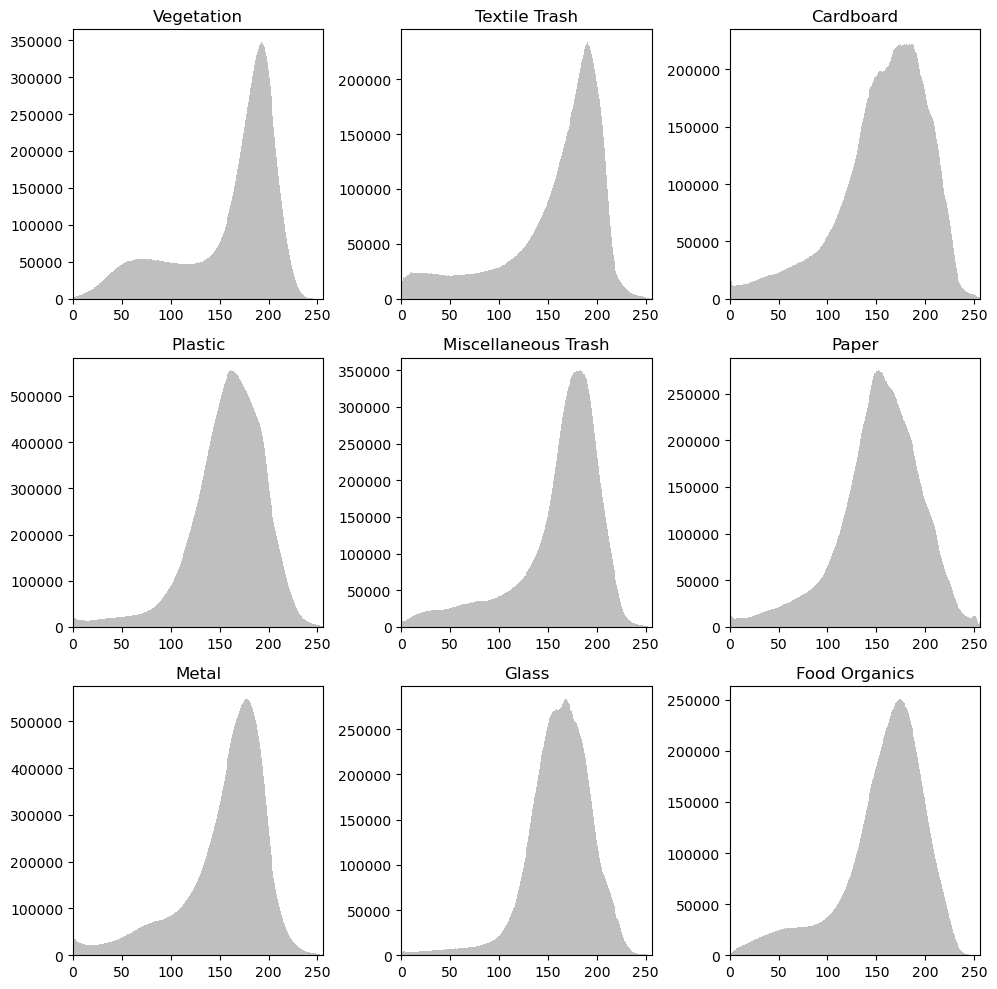

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3x3 Matrix von Subplots

axes = axes.ravel()  # Flacht die Achsen-Matrix in eine Liste ab

for i, class_name in enumerate(class_names):
    all_pixels = []
    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img_array in images_resized[class_name]:
        all_pixels.extend(img_array.ravel())

    # Erstelle ein aggregiertes Histogramm für die gesamte Klasse
    axes[i].hist(all_pixels, bins=256, range=[0,256], color='gray', alpha=0.5)
    axes[i].set_title(class_name)
    axes[i].set_xlim([0, 256])

plt.tight_layout()
plt.show()


Pixelintensitätsverteilung auf die **Farb-Bilder** über alle Klassen anwenden:

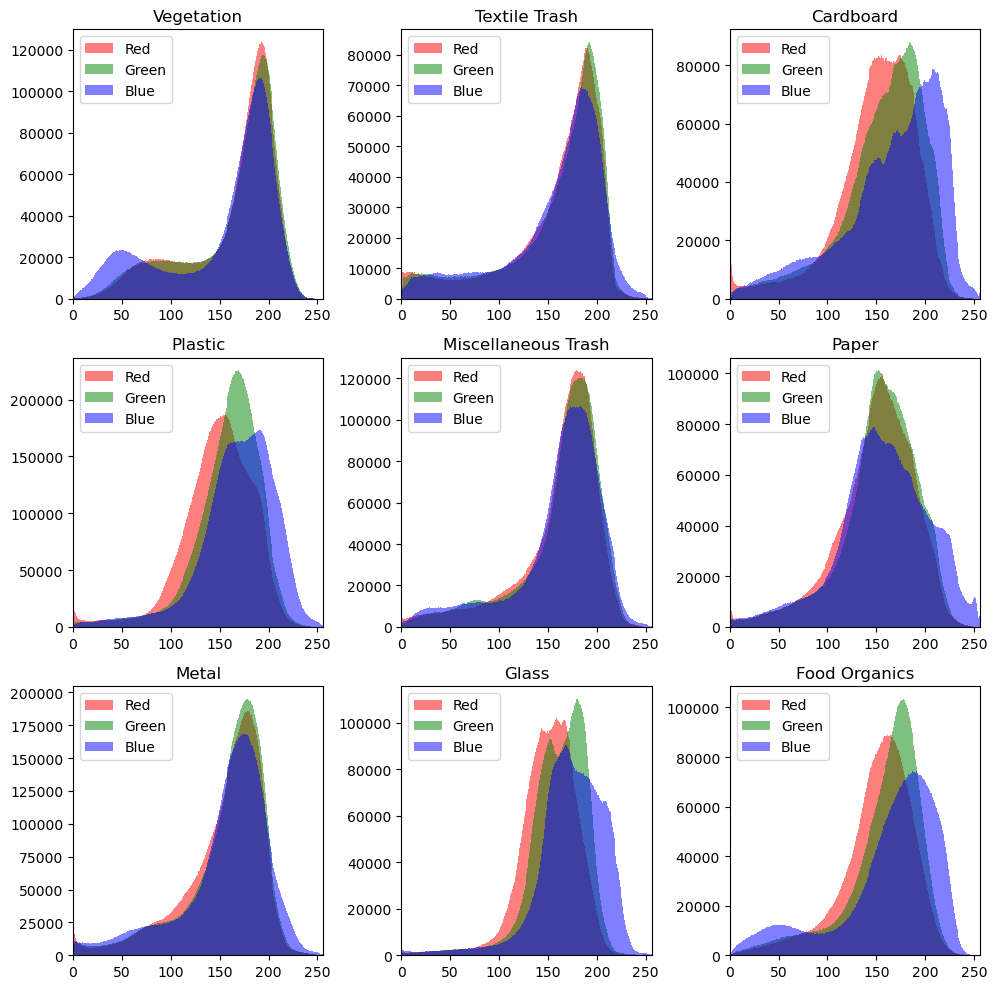

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Angenommen, `class_names` ist definiert und `images_resized` enthält die Bilder in Farbe
fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3x3 Matrix von Subplots

axes = axes.ravel()  # Flacht die Achsen-Matrix in eine Liste ab

for i, class_name in enumerate(class_names):
    # Initialisiere Listen für die Pixelintensitäten der Kanäle
    pixels_r = []
    pixels_g = []
    pixels_b = []

    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img in images_resized[class_name]:
        pixels_r.extend(img[:, :, 0].ravel())
        pixels_g.extend(img[:, :, 1].ravel())
        pixels_b.extend(img[:, :, 2].ravel())

    # Erstelle ein Histogramm für die RGB-Kanäle
    axes[i].hist(pixels_r, bins=256, range=[0,256], color='red', alpha=0.5, label='Red')
    axes[i].hist(pixels_g, bins=256, range=[0,256], color='green', alpha=0.5, label='Green')
    axes[i].hist(pixels_b, bins=256, range=[0,256], color='blue', alpha=0.5, label='Blue')

    axes[i].set_title(class_name)
    axes[i].set_xlim([0, 256])
    axes[i].legend()

plt.tight_layout()
plt.show()


Gib mir für jede Klasse der **Farbbilder** den **Median, den Durchschnitt und die Standardabweichung für RBG** aus.

In [ ]:
import numpy as np

# Angenommen, `class_names` ist definiert und `images_resized` enthält die RGB-Bilder
statistics = {}

for class_name in class_names:
    # Initialisiere Listen für die Pixelintensitäten der Kanäle
    pixels_r = []
    pixels_g = []
    pixels_b = []

    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img in images_resized[class_name]:
        pixels_r.extend(img[:, :, 0].ravel())
        pixels_g.extend(img[:, :, 1].ravel())
        pixels_b.extend(img[:, :, 2].ravel())

    # Berechne Statistiken für jeden Kanal
    statistics[class_name] = {
        'median': {
            'red': np.median(pixels_r),
            'green': np.median(pixels_g),
            'blue': np.median(pixels_b)
        },
        'mean': {
            'red': np.mean(pixels_r),
            'green': np.mean(pixels_g),
            'blue': np.mean(pixels_b)
        },
        'std_dev': {
            'red': np.std(pixels_r),
            'green': np.std(pixels_g),
            'blue': np.std(pixels_b)
        }
    }

# Ausgabe der berechneten Statistiken
for class_name, stats in statistics.items():
    print(f"Klasse: {class_name}")
    for stat_name, channels in stats.items():
        print(f"  {stat_name.capitalize()}:")
        for channel, value in channels.items():
            print(f"    {channel.capitalize()}: {value:.2f}")
    print()


Klasse: Vegetation
  Median:
    Red: 180.00
    Green: 180.00
    Blue: 175.00
  Mean:
    Red: 163.06
    Green: 163.13
    Blue: 152.37
  Std_dev:
    Red: 46.49
    Green: 47.85
    Blue: 57.20

Klasse: Textile Trash
  Median:
    Red: 173.00
    Green: 175.00
    Blue: 172.00
  Mean:
    Red: 156.09
    Green: 157.16
    Blue: 156.16
  Std_dev:
    Red: 51.20
    Green: 52.00
    Blue: 51.90

Klasse: Cardboard
  Median:
    Red: 155.00
    Green: 165.00
    Blue: 176.00
  Mean:
    Red: 149.12
    Green: 156.25
    Blue: 164.48
  Std_dev:
    Red: 41.09
    Green: 43.13
    Blue: 51.28

Klasse: Plastic
  Median:
    Red: 151.00
    Green: 163.00
    Blue: 173.00
  Mean:
    Red: 147.68
    Green: 157.91
    Blue: 167.93
  Std_dev:
    Red: 36.09
    Green: 34.28
    Blue: 39.05

Klasse: Miscellaneous Trash
  Median:
    Red: 171.00
    Green: 173.00
    Blue: 171.00
  Mean:
    Red: 159.98
    Green: 161.92
    Blue: 160.47
  Std_dev:
    Red: 42.93
    Green: 43.58
    Blue: 46.2

### Canny Edge Detection --> Feature extrahieren (funktioniert noch nicht)

In [ ]:
import cv2
from matplotlib import pyplot as plt

def apply_canny_edge_detection(images_resized, lower_threshold=100, upper_threshold=200):
    """
    Wendet Canny Edge Detection auf jedes Bild im images_resized Dictionary an.
    Die Schwellenwerte können angepasst werden, um die Empfindlichkeit der Kantenentdeckung zu steuern.

    Args:
    images_resized (dict): Ein Dictionary mit Klassennamen als Schlüssel und Listen von Bildern als Werte.
    lower_threshold (int): Der untere Schwellenwert für den Canny-Algorithmus.
    upper_threshold (int): Der obere Schwellenwert für den Canny-Algorithmus.

    Returns:
    dict: Ein Dictionary mit denselben Schlüsseln wie images_resized, aber die Bilder sind jetzt Kantenbilder.
    """
    images_canny = {}
    for class_name, images in images_resized.items():
        images_canny[class_name] = []
        for image in images:
            # Konvertiere das Bild in Graustufen, da Canny nur auf Ein-Kanal-Bilder angewendet wird
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            # Wende Canny Edge Detection an
            edges = cv2.Canny(gray_image, lower_threshold, upper_threshold)
            images_canny[class_name].append(edges)

    return images_canny

# Beispiel für die Anwendung von Canny Edge Detection
images_canny = apply_canny_edge_detection(images_resized)

# Optional: Anzeigen eines Bildes vor und nach der Anwendung von Canny Edge Detection
# Wählen Sie eine Klasse und ein Bildindex zum Anzeigen aus
class_name = list(images_canny.keys())[0]  # Erste Klasse auswählen
image_index = 0  # Erstes Bild auswählen

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(images_resized[class_name][image_index], cmap='gray')
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(images_canny[class_name][image_index], cmap='gray')
plt.title('Canny Edge Image')
plt.show()


In [ ]:
# Überprüfen Sie die Anzahl der Klassen und Bilder pro Klasse
for class_name, images in images_canny.items():
    print(f"Klasse: {class_name}, Anzahl der Bilder: {len(images)}")

# Versuchen Sie, ein Bild zu plotten, wenn vorhanden
if images_canny:  # Überprüfen Sie, ob das Dictionary nicht leer ist
    class_name = list(images_canny.keys())[0]  # Erste Klasse auswählen
    if images_canny[class_name]:  # Überprüfen Sie, ob Bilder in der Klasse vorhanden sind
        image_index = 0  # Erstes Bild auswählen
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(images_resized[class_name][image_index], cmap='gray')
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(images_canny[class_name][image_index], cmap='gray')
        plt.title('Canny Edge Image')
        plt.show()
    else:
        print(f"Keine Bilder in der Klasse {class_name} gefunden.")
else:
    print("Das Dictionary images_canny ist leer.")


#### Local Binary Patterns

In [ ]:
from skimage.feature import local_binary_pattern
import numpy as np

def compute_lbp_histogram(image, P, R, method='uniform'):
    """
    Berechnet das LBP (Local Binary Pattern) für ein Bild und erstellt ein Histogramm der LBP-Werte.

    :param image: Einzelnes Bild als numpy array.
    :param P: Anzahl der kreisförmigen Nachbarn für LBP.
    :param R: Radius für kreisförmige Nachbarn in LBP.
    :param method: Methode zur Berechnung des LBP.
    :return: Histogramm der LBP-Werte.
    """
    # Berechne LBP für das Bild
    lbp_image = local_binary_pattern(image, P, R, method)

    # Erstelle ein Histogramm der LBP-Werte
    # Für 'uniform' LBP werden (P+2) Bins verwendet, da es P+1 uniforme Muster gibt plus 1 Bin für nicht-uniforme Muster
    n_bins = int(lbp_image.max() + 1)
    histogram, _ = np.histogram(lbp_image.ravel(), density=True, bins=n_bins, range=(0, n_bins))

    return lbp_features

# Beispiel für die Anwendung dieser Funktion:
# Angenommen, Sie haben ein Graustufenbild 'image'
# histogram = compute_lbp_histogram(image, P=8, R=1)


## Dimensionaliätsreduktion / PCA auf den extrahierten Features

### PCA auf die vorverarbeiteten Daten durchführen

#### PCA mit 2 Dimensionen

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Erstelle eine Matrix mit allen Bildern, flachgedrückt zu Vektoren
# wir beziehen uns dabei auf 'images_resized'
image_matrix = np.array([img.flatten() for class_images in images_resized.values() for img in class_images])

# Skaliere die Daten, um einen Mittelwert von 0 und eine Standardabweichung von 1 zu haben
scaler = StandardScaler()
image_matrix_scaled = scaler.fit_transform(image_matrix)

# Wende PCA an
pca = PCA(n_components=2)  # Reduziere beispielsweise auf 2 Dimensionen
principal_components_2d = pca.fit_transform(image_matrix_scaled) # `principal_components_2d` enthält jetzt die transformierten Daten


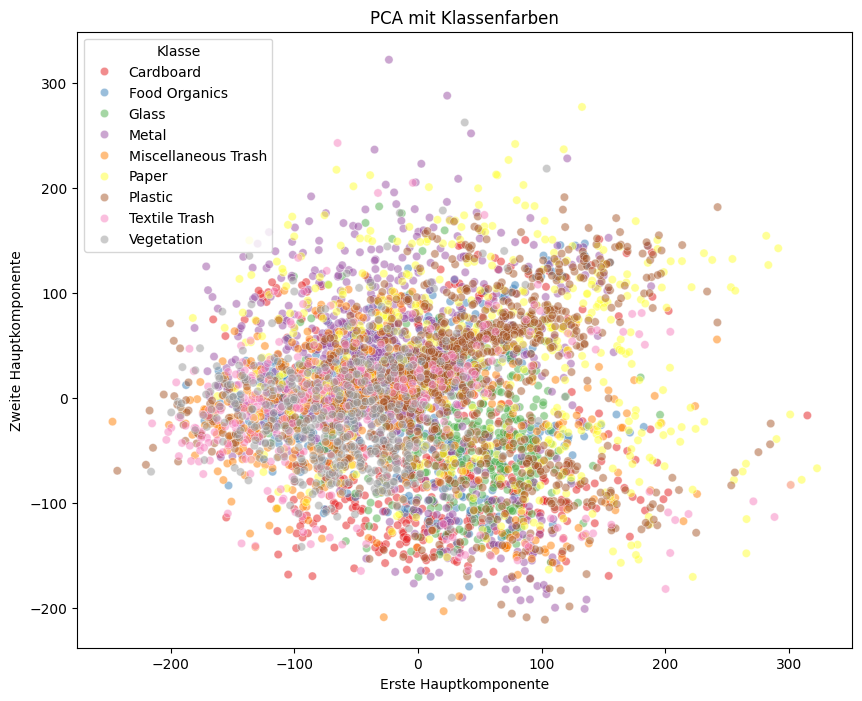

In [ ]:
import seaborn as sns
import pandas as pd

# Erstelle einen DataFrame für die Principal Components
df = pd.DataFrame(principal_components_2d, columns=['PC1', 'PC2'])

# Füge die Klassennamen hinzu. Angenommen, du hast eine Liste von Klassennamen,
# die der Reihenfolge der Bilder in `image_matrix` entsprechen.
class_labels = []
for class_name, images in images_resized.items():
    class_labels.extend([class_name] * len(images))
df['Klasse'] = class_labels

# Erstelle das Scatterplot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='PC1', y='PC2', hue='Klasse', palette='Set1', alpha=0.5)
plt.title('PCA mit Klassenfarben')
plt.xlabel('Erste Hauptkomponente')
plt.ylabel('Zweite Hauptkomponente')
plt.legend(title='Klasse')
plt.show()



#### PCA mit 3 Dimensionen

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Erstelle eine Matrix mit allen Bildern, flachgedrückt zu Vektoren
# wir beziehen uns auf 'images_resized'
image_matrix = np.array([img.flatten() for class_images in images_resized.values() for img in class_images])

# Skaliere die Daten, um einen Mittelwert von 0 und eine Standardabweichung von 1 zu haben
scaler = StandardScaler()
image_matrix_scaled = scaler.fit_transform(image_matrix)

# Wende PCA an
pca = PCA(n_components=3)  # Reduziere auf 3 Dimensionen
principal_components_3d = pca.fit_transform(image_matrix_scaled) # `principal_components_3d` enthält jetzt die transformierten Daten

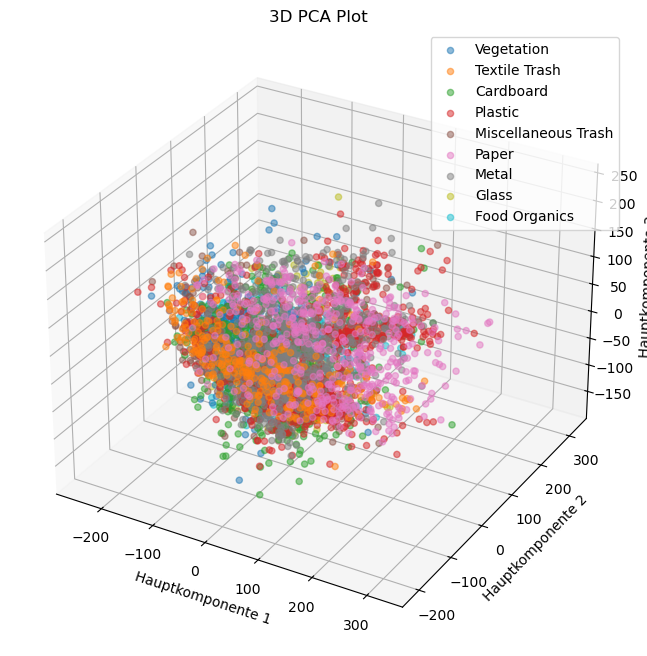

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Erzeuge eine Farbkarte basierend auf den Klassenlabels
colors = plt.cm.tab10(np.linspace(0, 1, len(class_names)))

# Scatterplot für jede Klasse
for class_name, color in zip(class_names, colors):
    # Wähle die Datenpunkte aus, die zur aktuellen Klasse gehören
    indices = [i for i, label in enumerate(class_labels) if label == class_name]
    ax.scatter(
        principal_components_3d[indices, 0],  # x-Werte
        principal_components_3d[indices, 1],  # y-Werte
        principal_components_3d[indices, 2],  # z-Werte
        label=class_name,
        color=color,
        alpha=0.5
    )

ax.set_xlabel('Hauptkomponente 1')
ax.set_ylabel('Hauptkomponente 2')
ax.set_zlabel('Hauptkomponente 3')
plt.title('3D PCA Plot')
plt.legend()
plt.show()


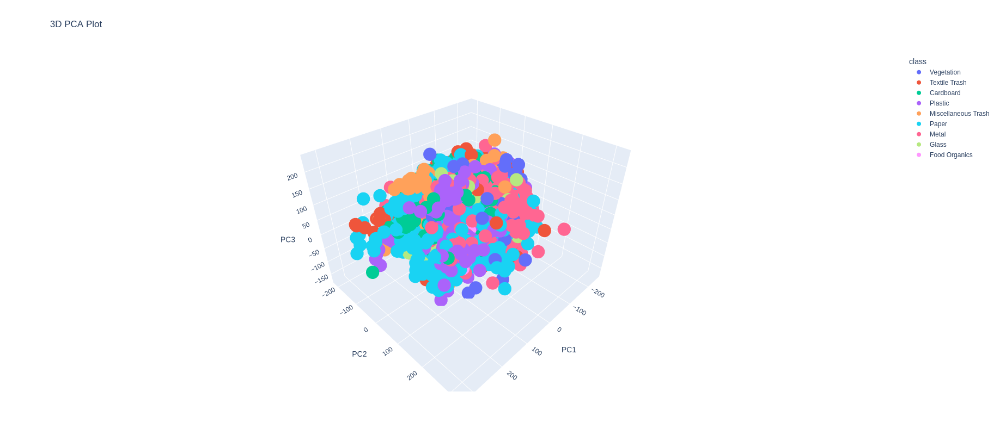

In [ ]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(principal_components_3d, columns=['PC1', 'PC2', 'PC3'])
df['class'] = class_labels  # Stelle sicher, dass class_labels die richtigen Klassenlabels sind

# Erstelle ein 3D-Scatterplot-Diagramm
fig = px.scatter_3d(df, x='PC1', y='PC2', z='PC3',
                    color='class',  # Definiert die Farbkodierung
                    title="3D PCA Plot")

# Update die Layout-Einstellungen, um die Größe des Plots zu ändern
fig.update_layout(width=1000, height=800)

fig.show()


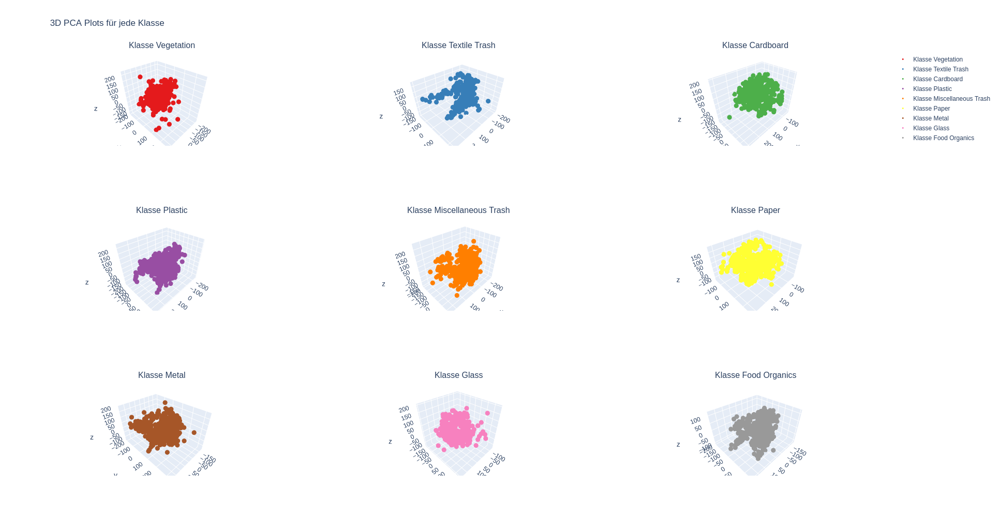

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Eindeutige Klassenlabels
unique_labels = df['class'].unique()

# Erstelle ein Subplot-Grid
fig = make_subplots(
    rows=3, cols=3,
    specs=[[{'type': 'scatter3d'} for _ in range(3)] for _ in range(3)],
    subplot_titles=[f'Klasse {label}' for label in unique_labels]
)

# Farbpalette festlegen
set1_palette = px.colors.qualitative.Set1

# Füge für jede Klasse einen 3D-Scatterplot hinzu
for i, label in enumerate(unique_labels):
    class_df = df[df['class'] == label]
    trace = go.Scatter3d(
        x=class_df['PC1'], y=class_df['PC2'], z=class_df['PC3'],
        mode='markers',
        marker=dict(
            size=3,
            color=set1_palette[i % len(set1_palette)],  # Farbe für die Klasse
        ),
        name=f'Klasse {label}'
    )
    fig.add_trace(trace, row=i//3+1, col=i%3+1)

# Update die Layout-Einstellungen für Plotgröße
fig.update_layout(height=900, width=900, title_text="3D PCA Plots für jede Klasse")

# Update die Layout-Einstellungen für jedes Subplot
for i in range(1, 10):
    fig.update_scenes(
        dict(
            camera=dict(
                eye=dict(x=1.25, y=1.25, z=1.25)
            )
        ),
        row=(i-1)//3+1,
        col=(i-1)%3+1
    )
fig.update_layout(width=1000, height=1000)

fig.show()


### PCA auf 'feature_array_combined' durchführen

### Training mit Hyperparameter Tunning und Kreuzvalidierung

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

def train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test):
    # Modelle mit zugehörigen Hyperparameter-Grids
    model_params = {
        "KNN": {
            "model": KNeighborsClassifier(),
            "params": {
                "n_neighbors": [3, 5, 7, 9],
                "weights": ["uniform", "distance"],
                "metric": ["euclidean", "manhattan"]
            }
        },
        "SVM": {
            "model": SVC(),
            "params": {
                "C": [0.1, 1, 10],
                "kernel": ["rbf", "linear"],
                "gamma": ["scale", "auto"]
            }
        },
        "Random Forest": {
            "model": RandomForestClassifier(random_state=42),
            "params": {
                "n_estimators": [10, 50, 100],
                "max_depth": [None, 10, 20, 30],
                "min_samples_split": [2, 5, 10]
            }
        }
    }

    # Hyperparameter tuning and evaluation
    for name, mp in model_params.items():
        clf = GridSearchCV(mp["model"], mp["params"], cv=5, scoring='accuracy') # cross-validation
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        print(f"=== {name} ===")
        print("Best parameters:", clf.best_params_)
        print("Best cross-validation accuracy:", clf.best_score_)
        print("Test set accuracy:", accuracy_score(y_test, y_pred))
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("\n")

In [ ]:
train_and_evaluate_with_tuning(X_train, X_test, y_train, y_test)

=== KNN ===
Best parameters: {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'distance'}
Best cross-validation accuracy: 0.6669320146621481
Test set accuracy: 0.647739221871714
Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.72      0.65      0.69        92
      Food Organics       0.75      0.68      0.71        82
              Glass       0.81      0.79      0.80        84
              Metal       0.58      0.61      0.59       158
Miscellaneous Trash       0.53      0.52      0.52        99
              Paper       0.57      0.50      0.53       100
            Plastic       0.61      0.66      0.64       185
      Textile Trash       0.56      0.55      0.55        64
         Vegetation       0.80      0.91      0.85        87

           accuracy                           0.65       951
          macro avg       0.66      0.65      0.65       951
       weighted avg       0.65      0.65      0.65       951
